In [120]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
from plotnine import *

from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# DBSCAN with Multiple Data Sets

Read [here](https://www.aaai.org/Papers/KDD/1996/KDD96-037.pdf) if math excites you.

## Dataset 1

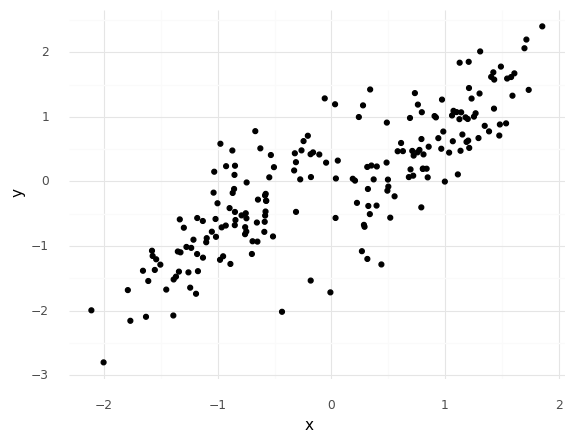

<ggplot: (170827269277)>

In [121]:
d1 = pd.read_csv("https://raw.githubusercontent.com/cmparlettpelleriti/CPSC392ParlettPelleriti/master/Data/KMEM1.csv")

z = StandardScaler()
d1[["x","y"]] = z.fit_transform(d1)

ggplot(d1, aes(x = "x", y = "y")) + geom_point() + theme_minimal()

### DBSCAN

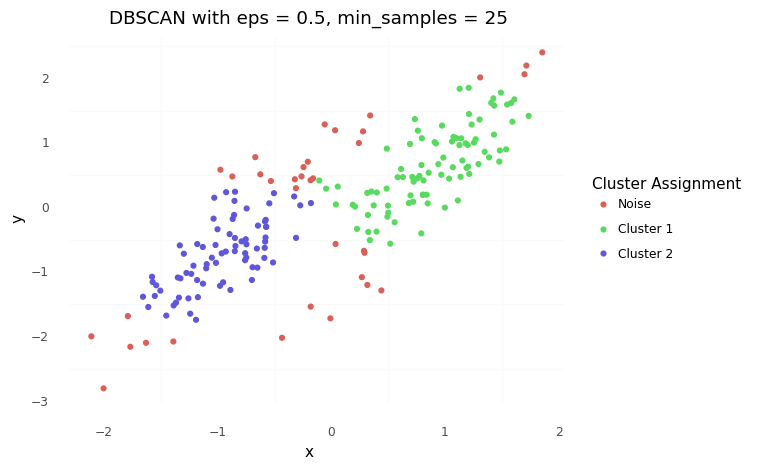

<ggplot: (170829185493)>

In [122]:
data = d1.copy()

# dbscan and plot
db1 = DBSCAN(eps = 0.5, min_samples = 25).fit(d1)

labsList = ["Noise"]
labsList = labsList  + ["Cluster " + str(i) for i in range(1,len(set(db1.labels_)))]

data["assignments"] = db1.labels_

(ggplot(data, aes(x = "x", y = "y", color = "factor(assignments)")) +
 geom_point() +
 theme_minimal() +
 scale_color_discrete(name = "Cluster Assignment",
                      labels = labsList) +
theme(panel_grid_major = element_blank()) +
labs(title = "DBSCAN with eps = 0.5, min_samples = 25"))

In [123]:
# grab only clustered data points
data_clustered = data.loc[(data.assignments >= 0)]

silhouette_score(data_clustered[["x","y"]], data_clustered["assignments"])

0.6169609560667532

In [124]:
# overall 
silhouette_score(data[["x","y"]], data["assignments"])

0.39760284702143056

### K-Means

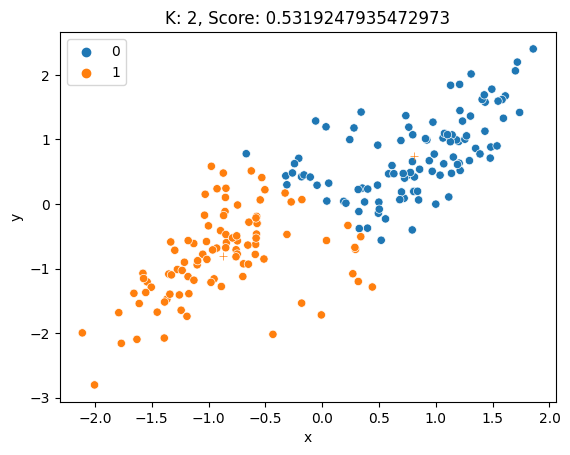

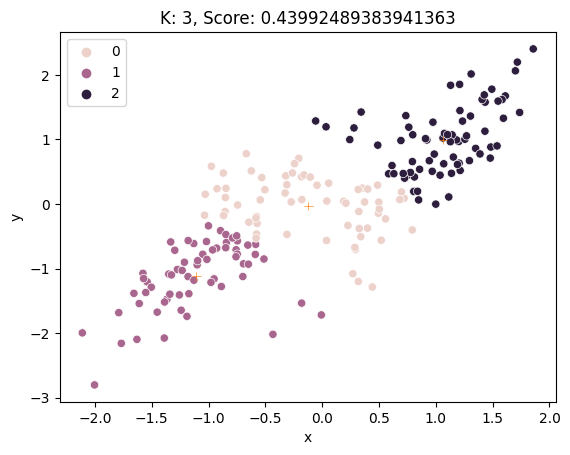

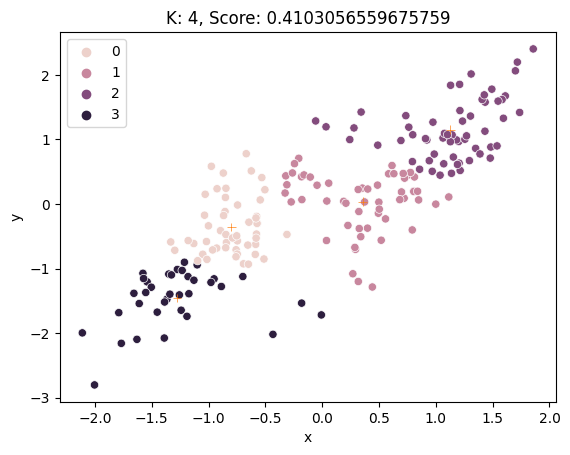

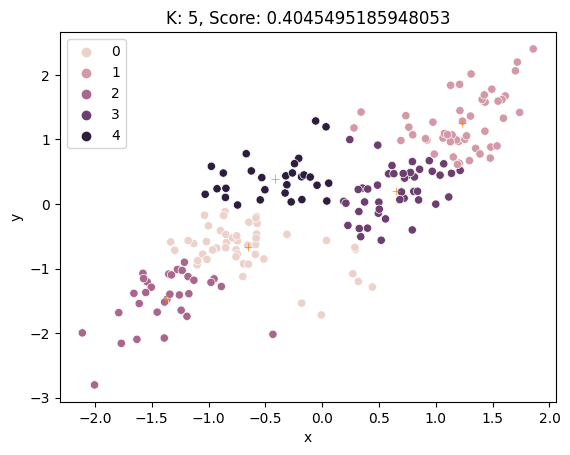

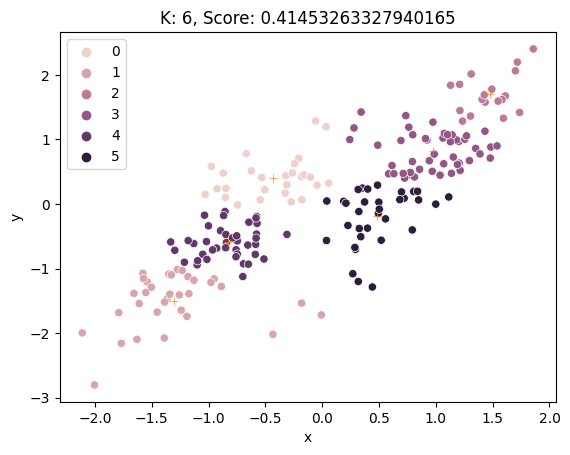

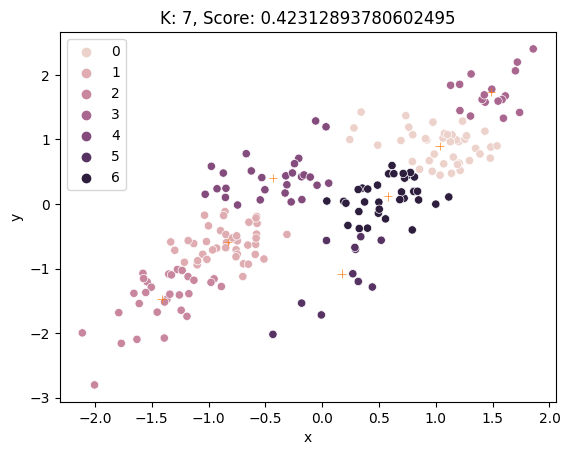

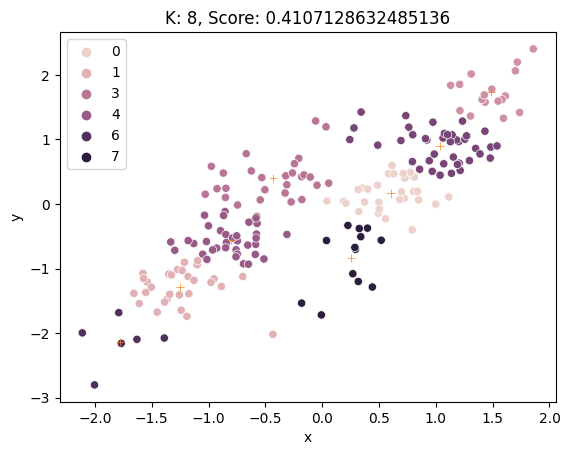

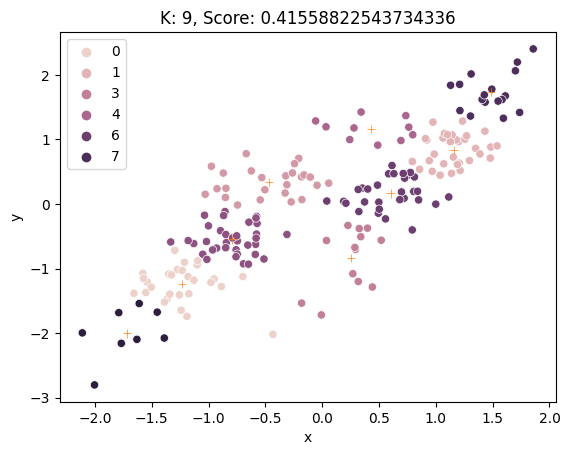

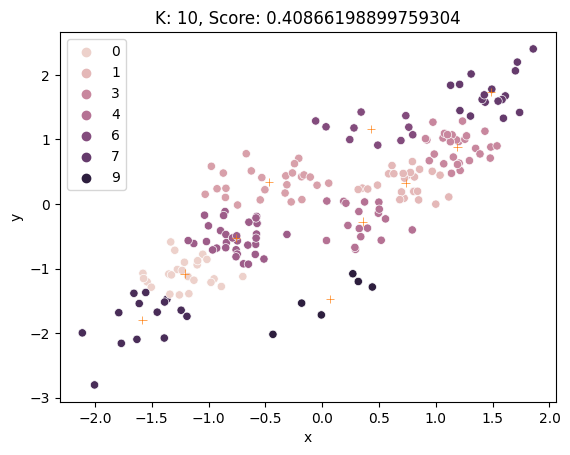

In [125]:
data = d1.copy()
for k in range(2, 11):
    model = KMeans(k)
    model.fit(d1)
    sns.scatterplot(data=d1, x='x', y='y', hue=model.labels_)
    sns.scatterplot(x=model.cluster_centers_[:,0], y=model.cluster_centers_[:,1], style=True, markers="+", legend=False)
    score = silhouette_score(d1, model.labels_)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()


### Hierarchical

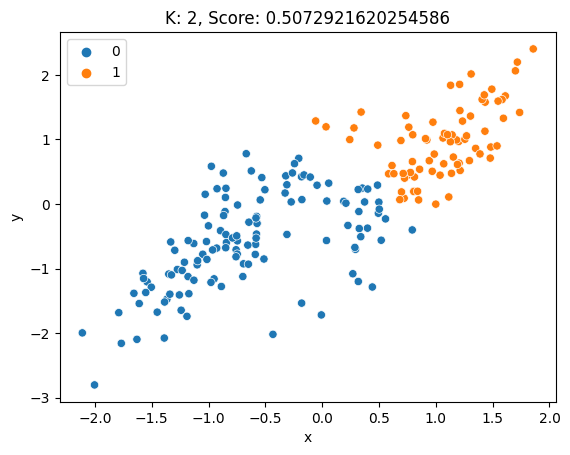

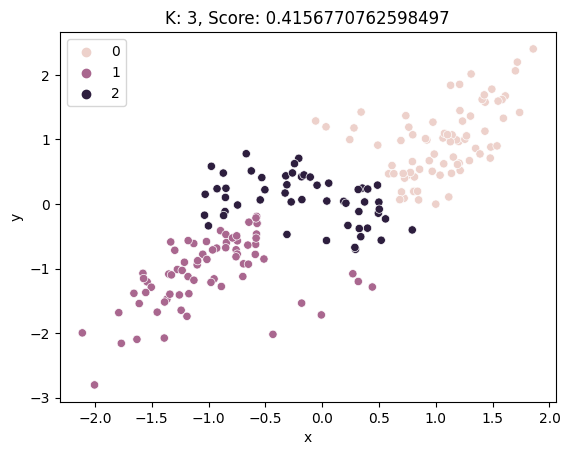

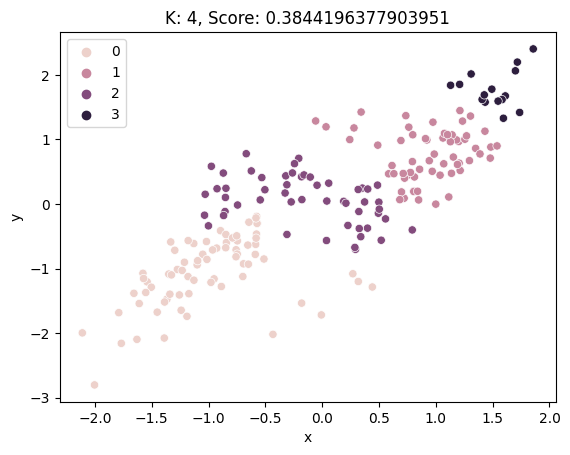

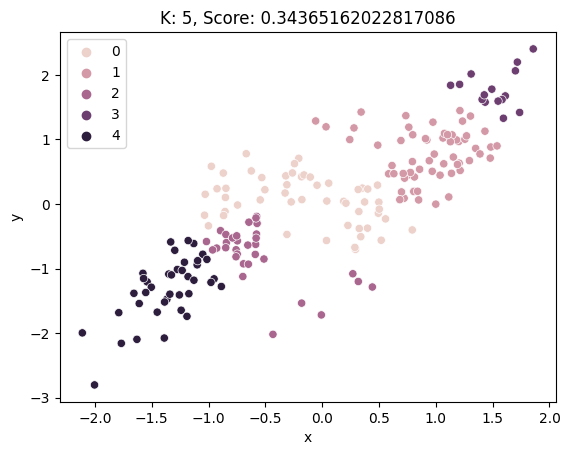

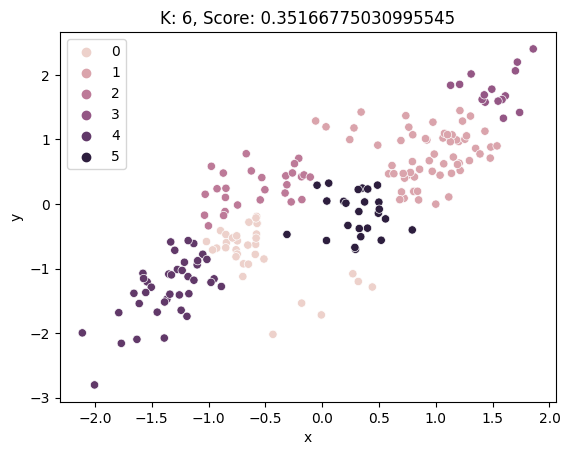

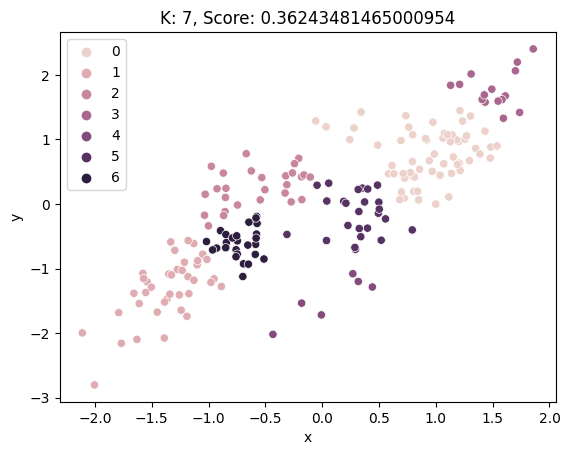

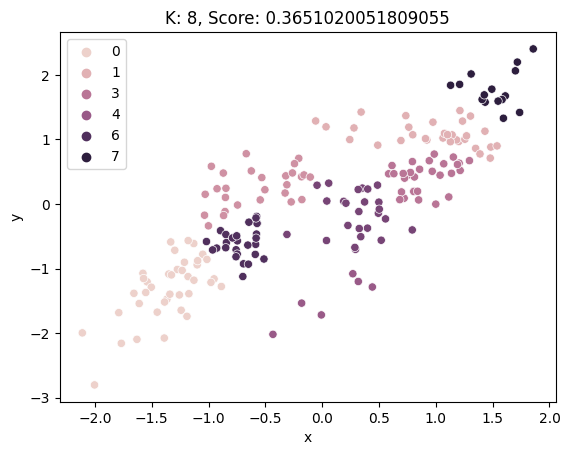

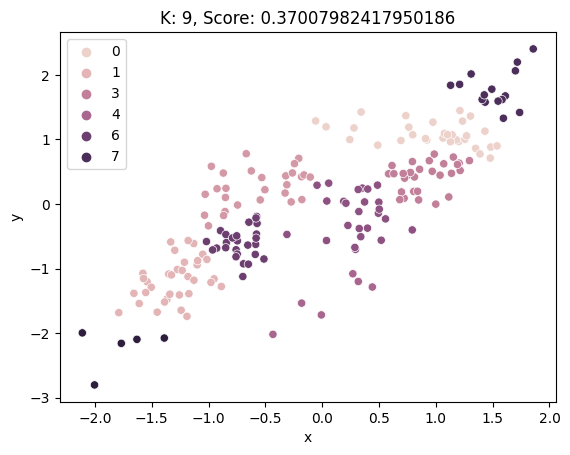

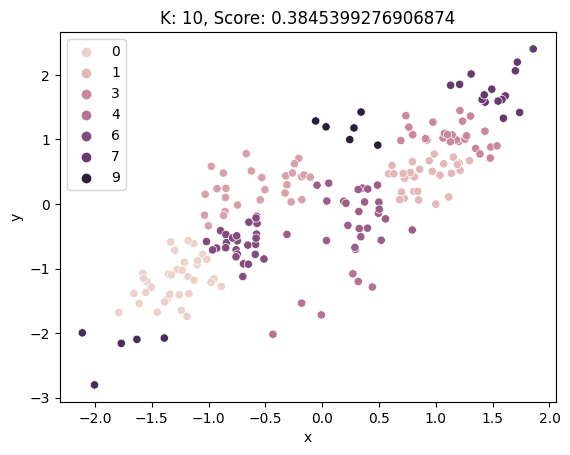

In [126]:
data = d1.copy()
for k in range(2, 11):
    model = AgglomerativeClustering(n_clusters=k)
    model.fit(d1)
    sns.scatterplot(data=d1, x='x', y='y', hue=model.labels_)
    score = silhouette_score(d1, model.labels_)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()

### GaussianMixture

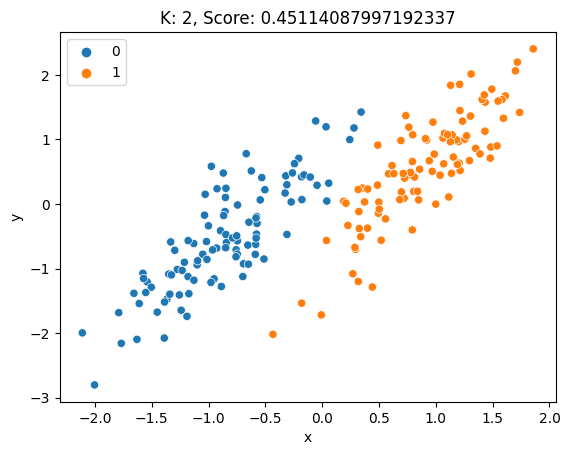

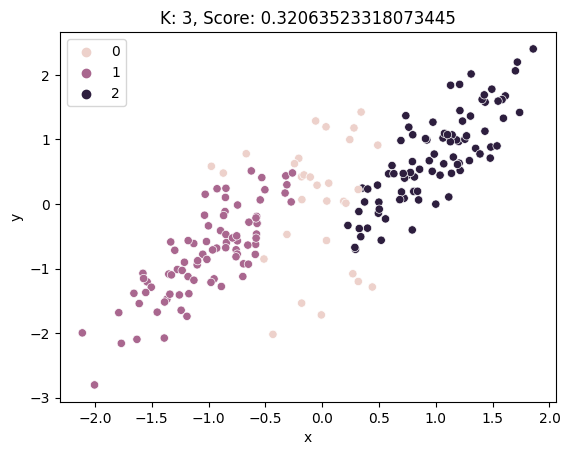

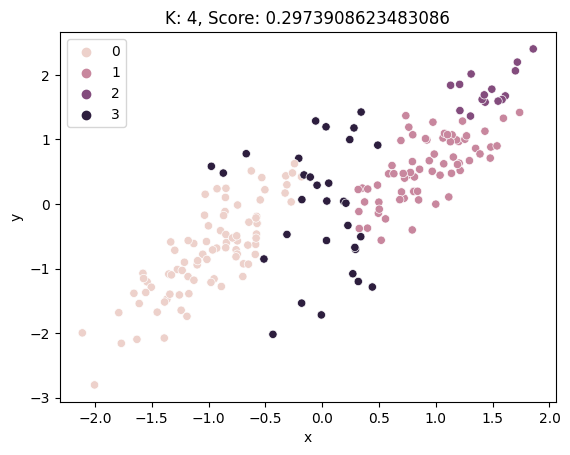

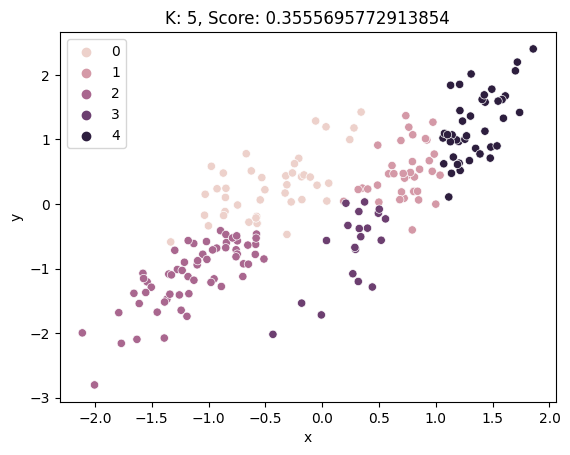

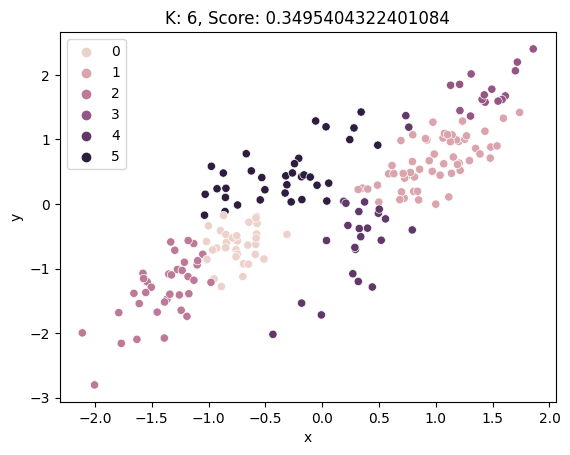

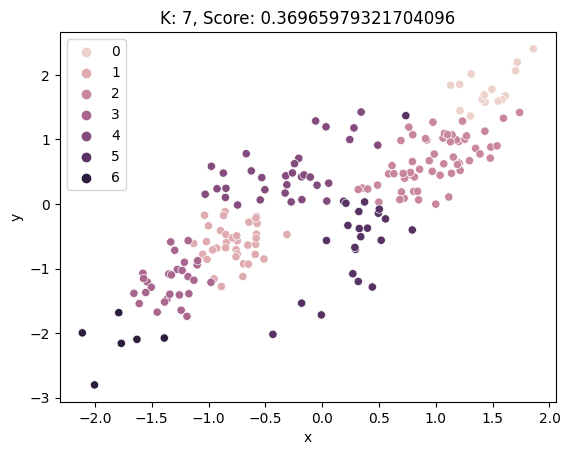

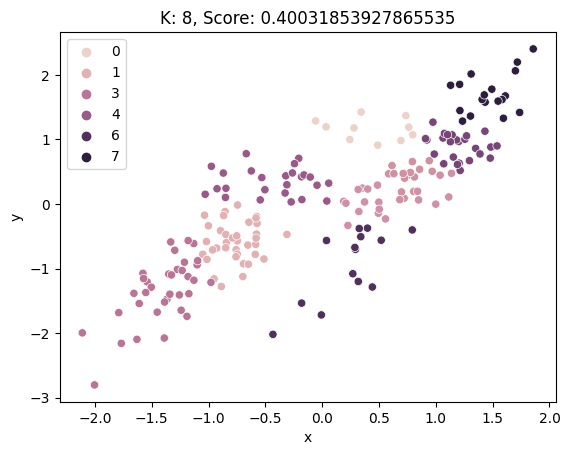

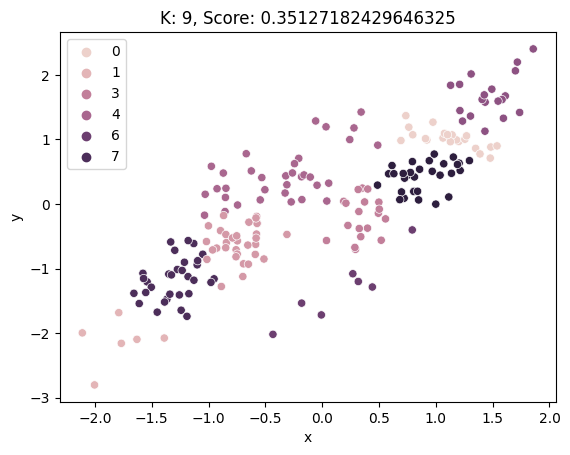

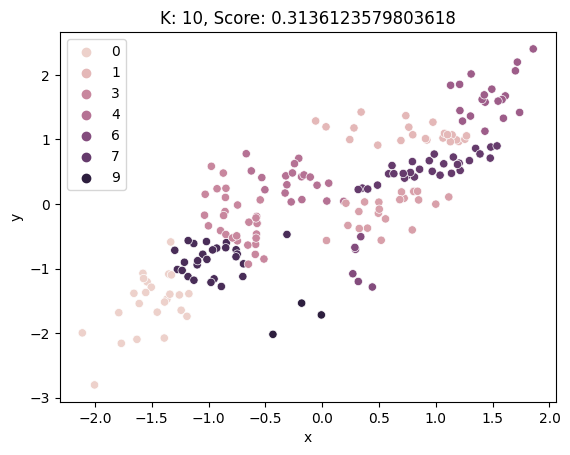

In [127]:
data = d1.copy()
for k in range(2, 11):
    model = GaussianMixture(k)
    model.fit(d1)
    labels = model.predict(d1)
    sns.scatterplot(data=d1, x='x', y='y', hue=labels)
    score = silhouette_score(d1, labels)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()


## Dataset 2

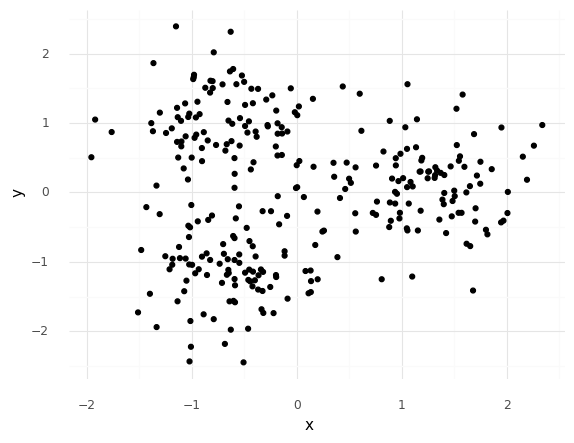

<ggplot: (170827252529)>

In [128]:
d2 = pd.read_csv("https://raw.githubusercontent.com/cmparlettpelleriti/CPSC392ParlettPelleriti/master/Data/KMEM2.csv")

z = StandardScaler()
d2[["x","y"]] = z.fit_transform(d2)

ggplot(d2, aes(x = "x", y = "y")) + geom_point() + theme_minimal()

### DBSCAN

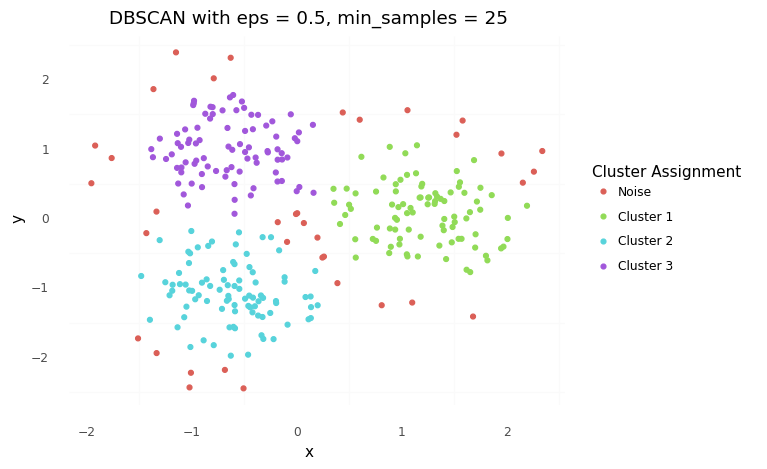

<ggplot: (170829139701)>

In [129]:
data = d2.copy()
db2 = DBSCAN(eps = 0.5, min_samples = 25).fit(d2)

labsList = ["Noise"]
labsList = labsList  + ["Cluster " + str(i) for i in range(1,len(set(db2.labels_)))]

data["assignments"] = db2.labels_
(ggplot(data, aes(x = "x", y = "y", color = "factor(assignments)")) +
 geom_point() +
 theme_minimal() +
 scale_color_discrete(name = "Cluster Assignment",
                      labels = labsList) +
theme(panel_grid_major = element_blank()) +
labs(title = "DBSCAN with eps = 0.5, min_samples = 25"))

In [130]:
# grab only clustered data points
data_clustered = data.loc[(data.assignments >= 0)]

print(silhouette_score(data_clustered[["x","y"]], data_clustered["assignments"]))

# overall 
print(silhouette_score(d2[["x","y"]], data["assignments"]))

0.6140043544818719
0.4803831307840633


### K-Means

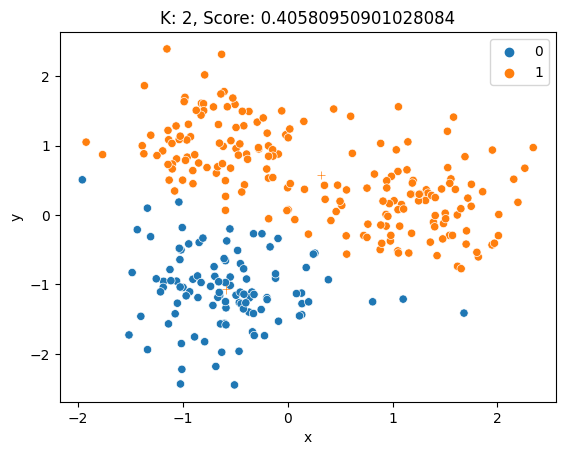

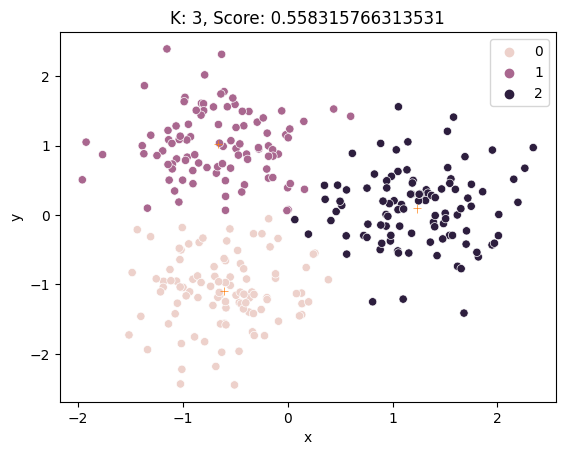

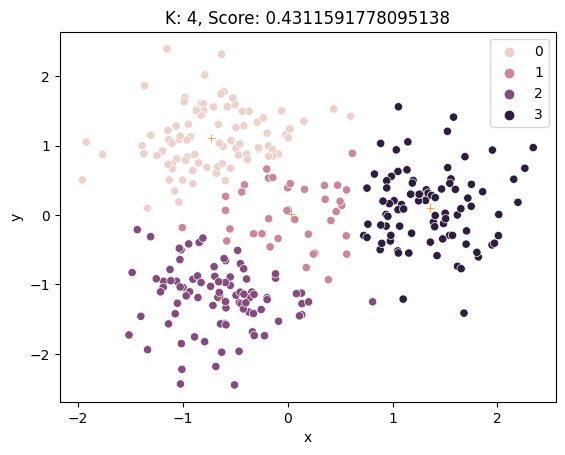

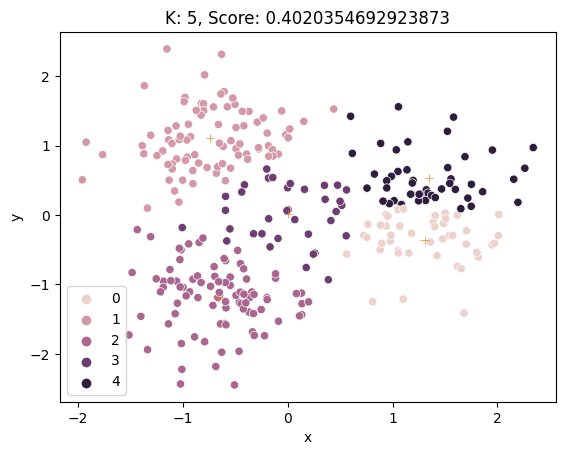

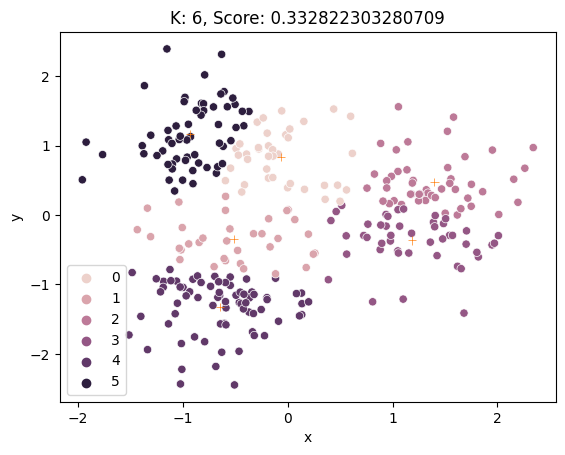

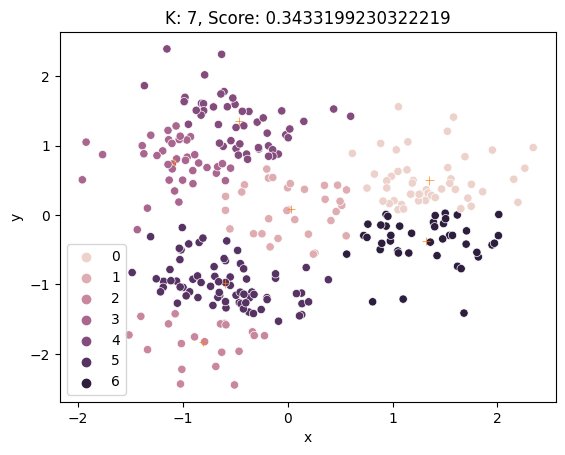

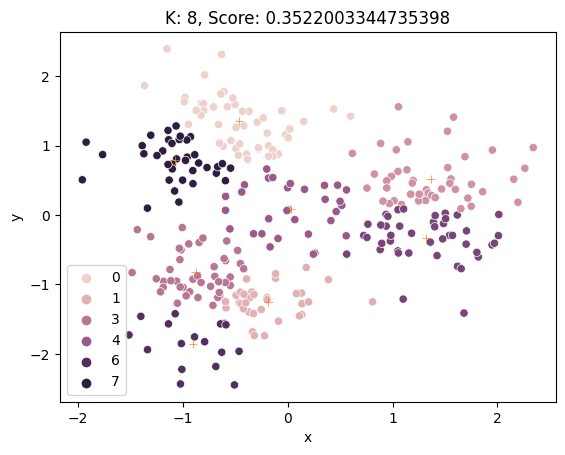

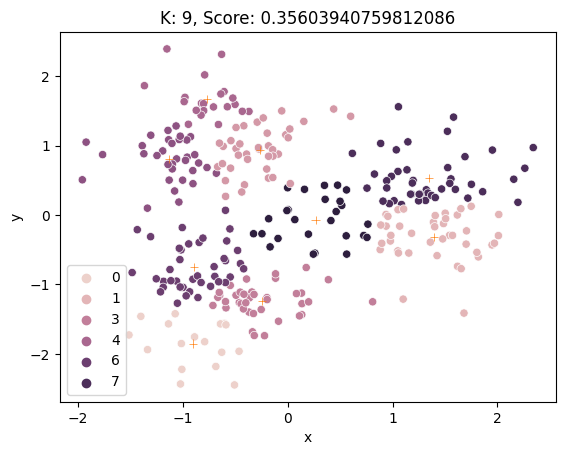

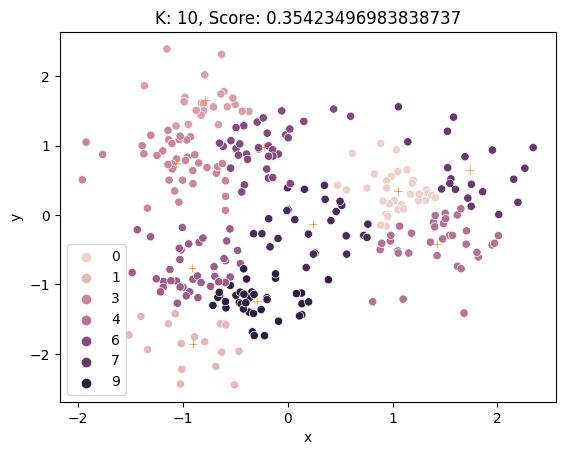

In [131]:
data = d2.copy()
for k in range(2, 11):
    model = KMeans(k)
    model.fit(data)
    sns.scatterplot(data=data, x='x', y='y', hue=model.labels_)
    sns.scatterplot(x=model.cluster_centers_[:,0], y=model.cluster_centers_[:,1], style=True, markers="+", legend=False)
    score = silhouette_score(data, model.labels_)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()


### Hierarchical

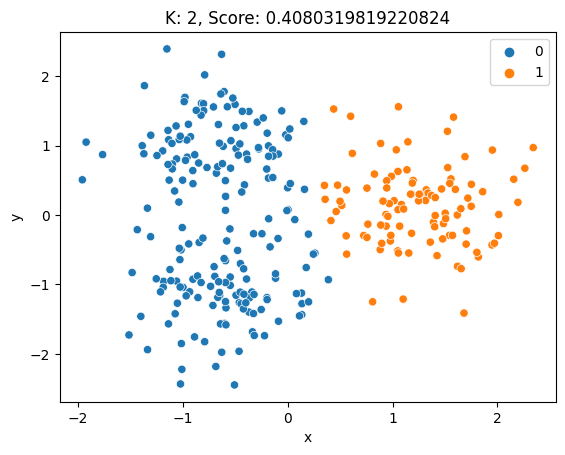

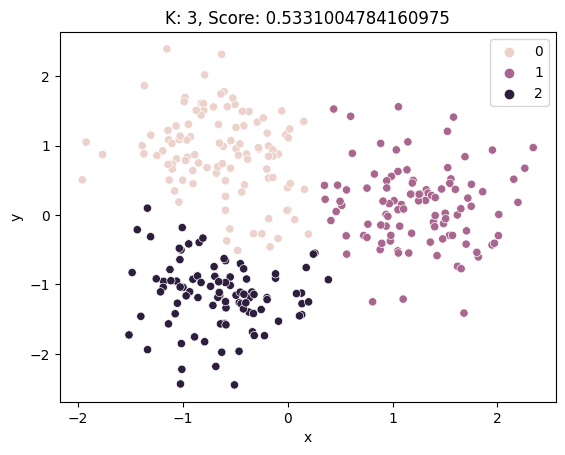

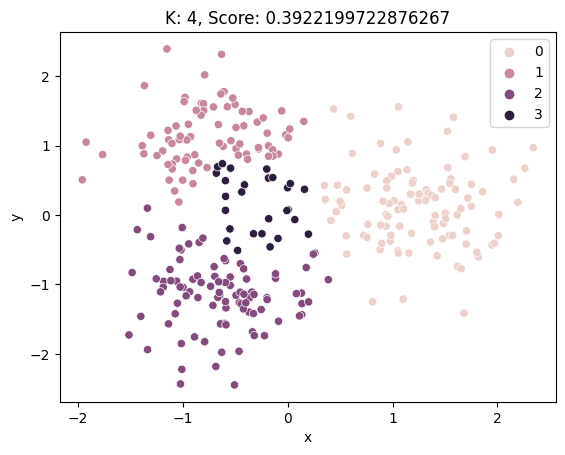

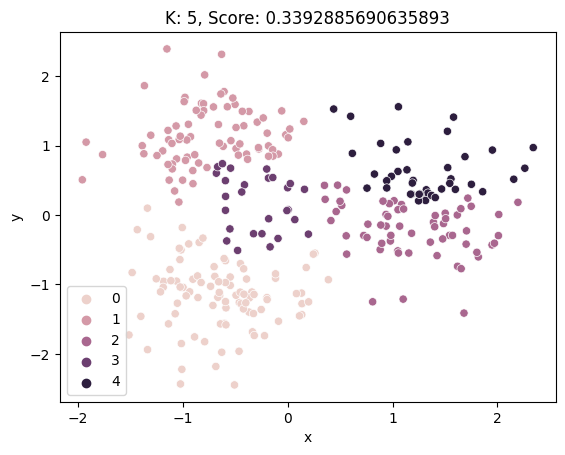

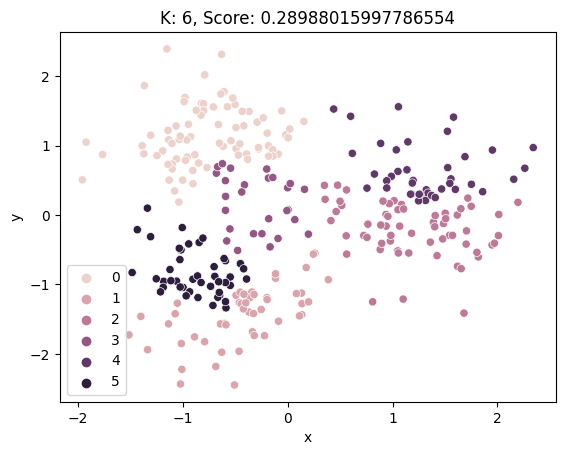

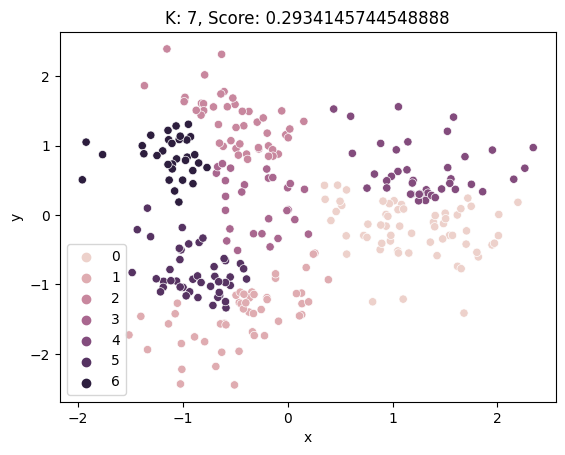

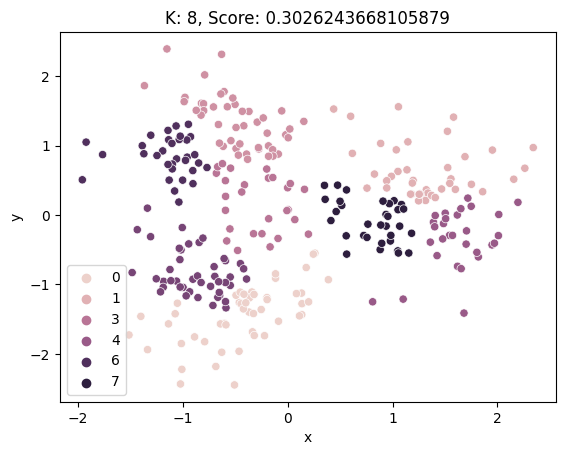

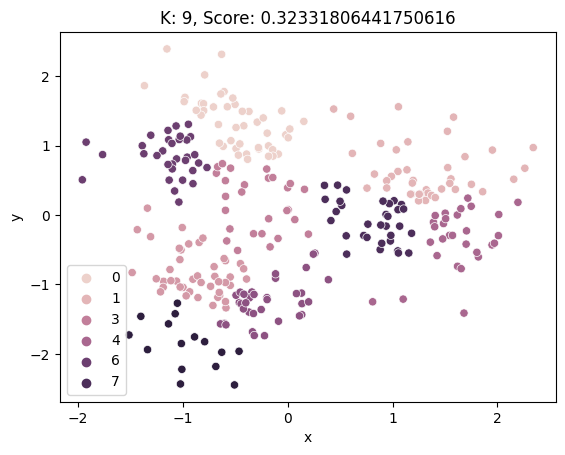

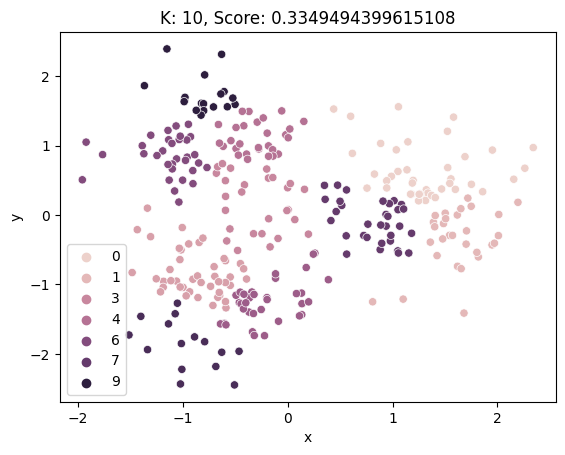

In [132]:
data = d2.copy()
for k in range(2, 11):
    model = AgglomerativeClustering(n_clusters=k)
    model.fit(data)
    sns.scatterplot(data=data, x='x', y='y', hue=model.labels_)
    score = silhouette_score(data, model.labels_)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()

### GaussianMixture

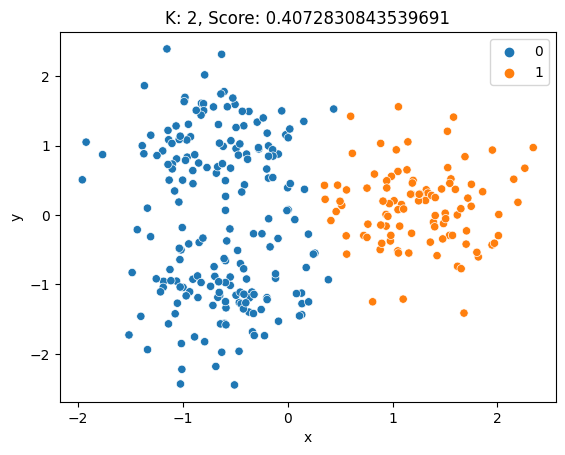

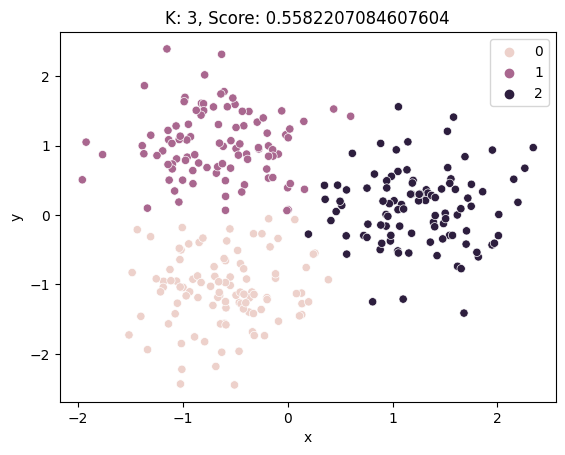

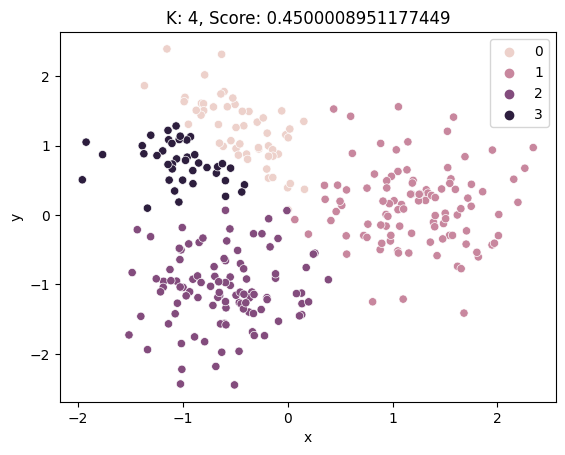

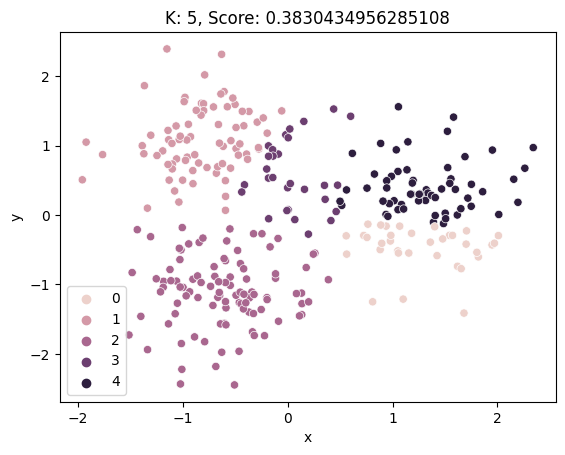

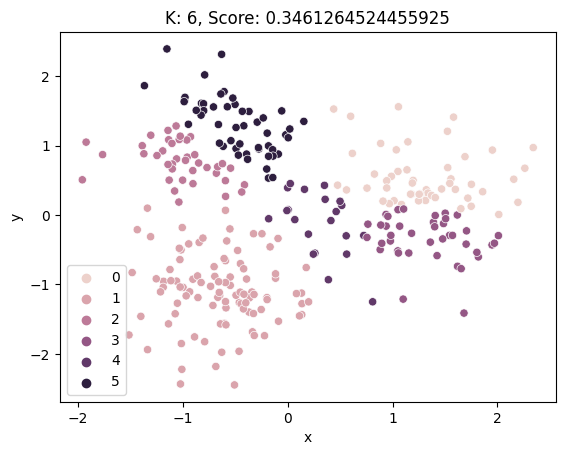

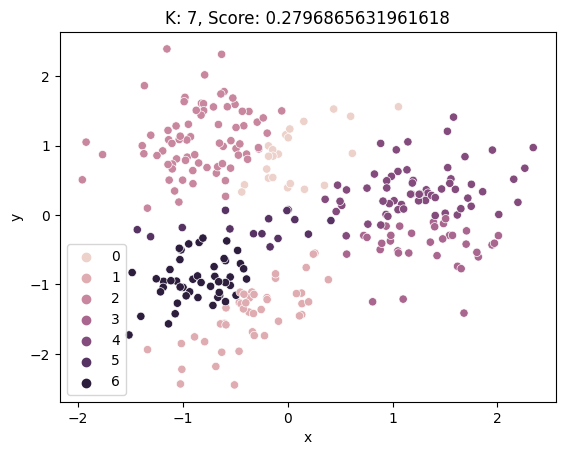

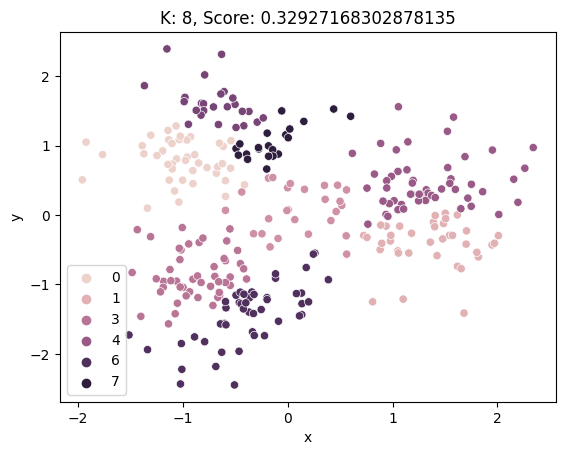

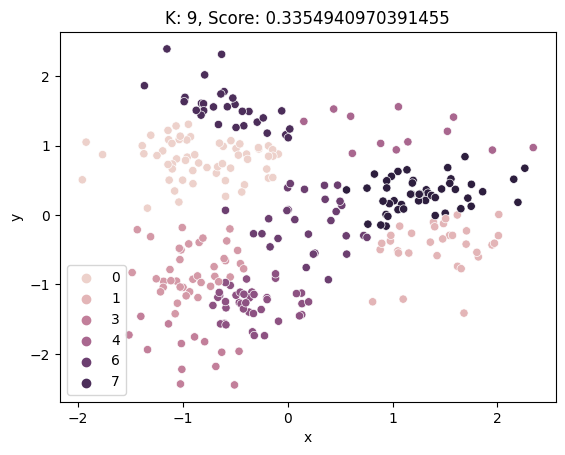

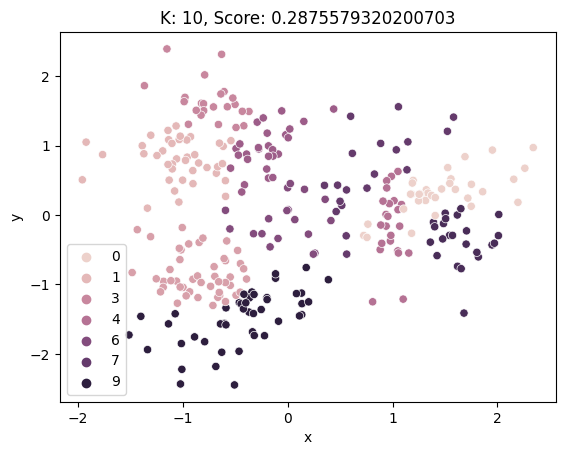

In [133]:
data = d2.copy()
for k in range(2, 11):
    model = GaussianMixture(k)
    model.fit(data)
    labels = model.predict(data)
    sns.scatterplot(data=data, x='x', y='y', hue=labels)
    score = silhouette_score(data, labels)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()


## Dataset 3

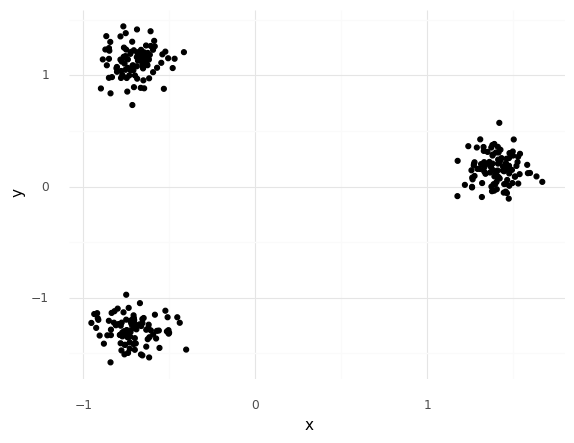

<ggplot: (170828908209)>

In [134]:
d3 = pd.read_csv("https://raw.githubusercontent.com/cmparlettpelleriti/CPSC392ParlettPelleriti/master/Data/KMEM3.csv")

z = StandardScaler()
d3[["x","y"]] = z.fit_transform(d3)

ggplot(d3, aes(x = "x", y = "y")) + geom_point() + theme_minimal()

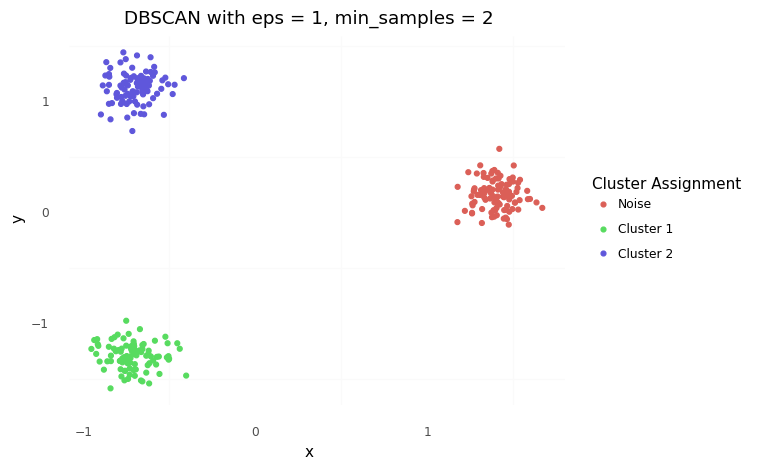

<ggplot: (170829177709)>

In [135]:
data = d3.copy()
db3 = DBSCAN(eps = 1, min_samples = 2).fit(d3)

labsList = ["Noise"]
labsList = labsList  + ["Cluster " + str(i) for i in range(1,len(set(db3.labels_)))]

data["assignments"] = db3.labels_

(ggplot(data, aes(x = "x", y = "y", color = "factor(assignments)")) +
 geom_point() +
 theme_minimal() +
 scale_color_discrete(name = "Cluster Assignment",
                      labels = labsList) +
theme(panel_grid_major = element_blank()) +
labs(title = "DBSCAN with eps = 1, min_samples = 2"))

In [136]:
# grab only clustered data points
data_clustered = data.loc[(data.assignments >= 0)]

print(silhouette_score(data_clustered[["x","y"]], data_clustered["assignments"]))

# overall 
print(silhouette_score(data[["x","y"]], data["assignments"]))

0.913619050733588
0.913619050733588


### K-Means

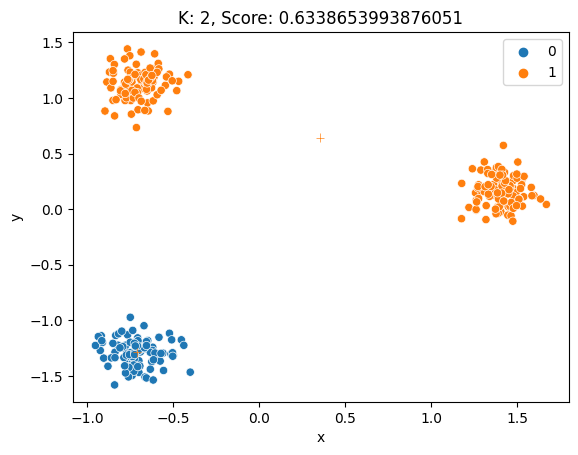

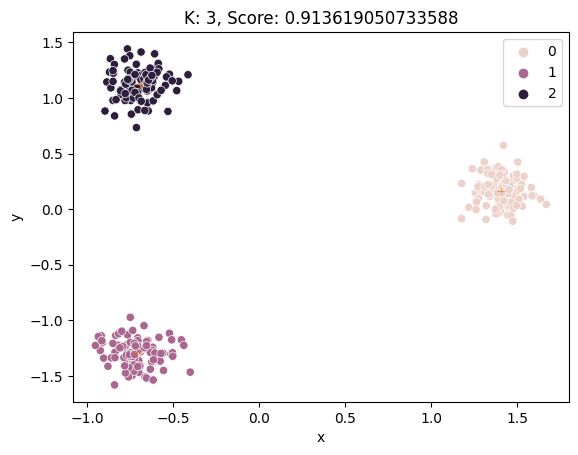

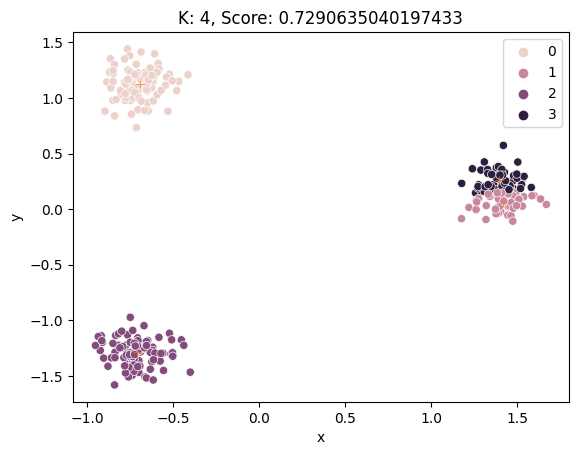

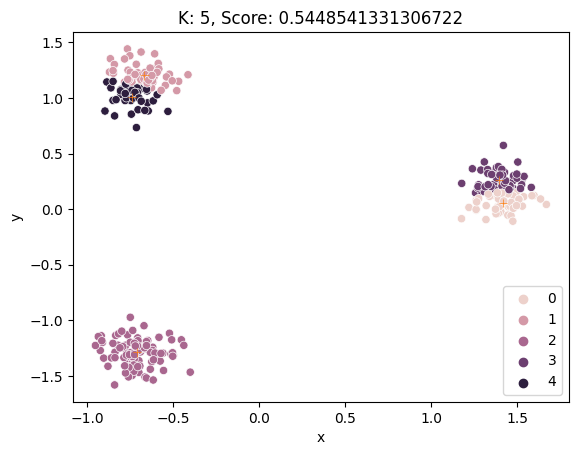

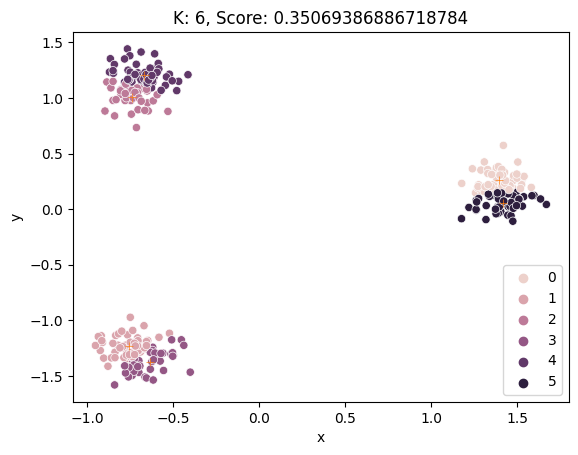

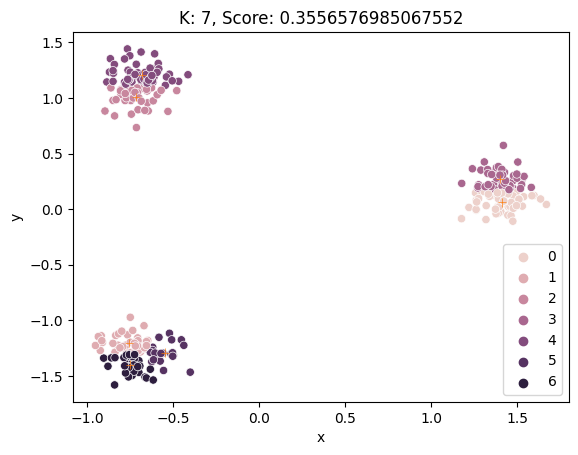

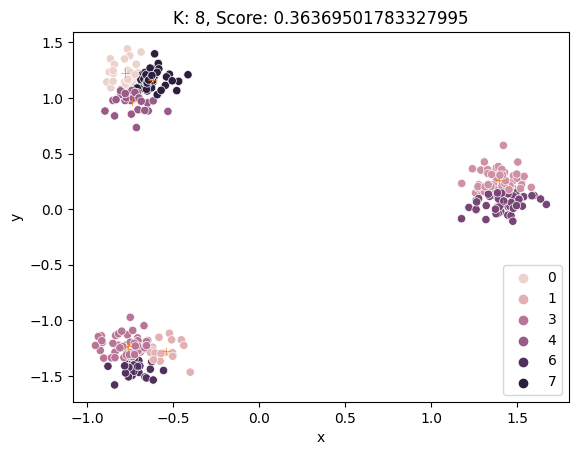

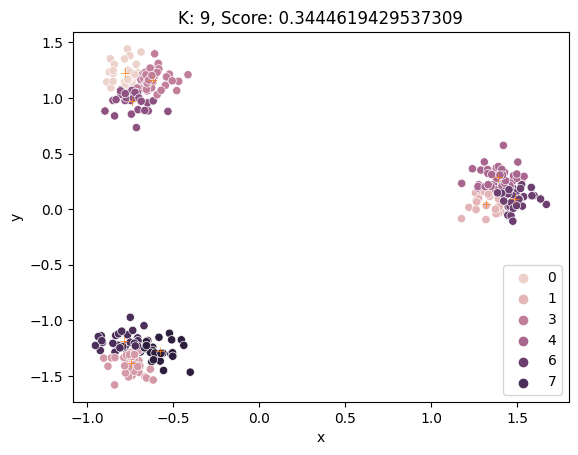

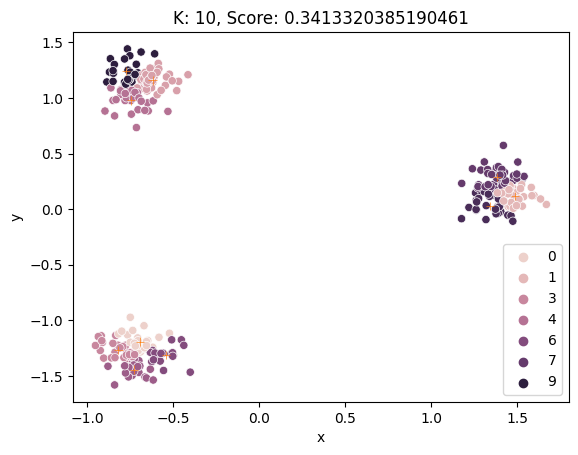

In [137]:
data = d3.copy()
for k in range(2, 11):
    model = KMeans(k)
    model.fit(data)
    sns.scatterplot(data=data, x='x', y='y', hue=model.labels_)
    sns.scatterplot(x=model.cluster_centers_[:,0], y=model.cluster_centers_[:,1], style=True, markers="+", legend=False)
    score = silhouette_score(data, model.labels_)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()


### Hierarchical

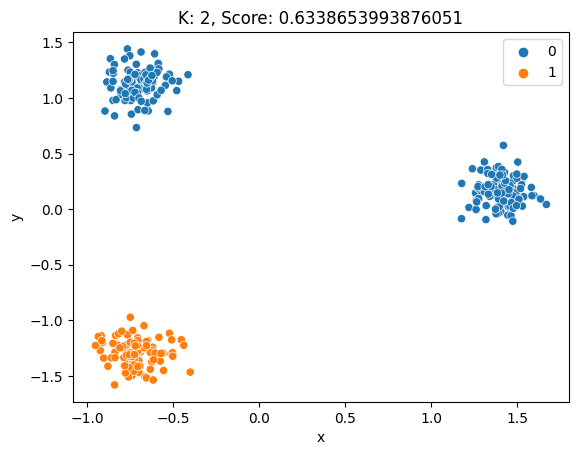

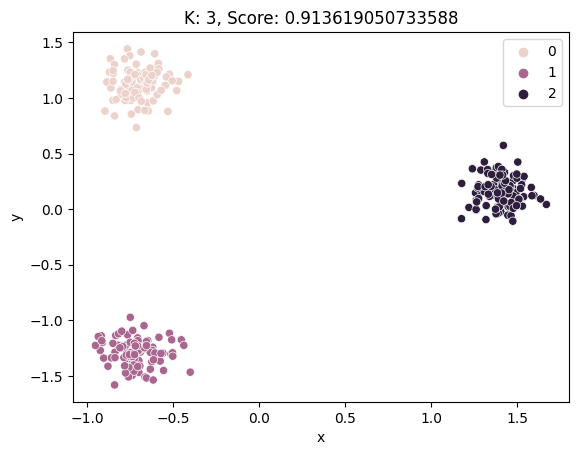

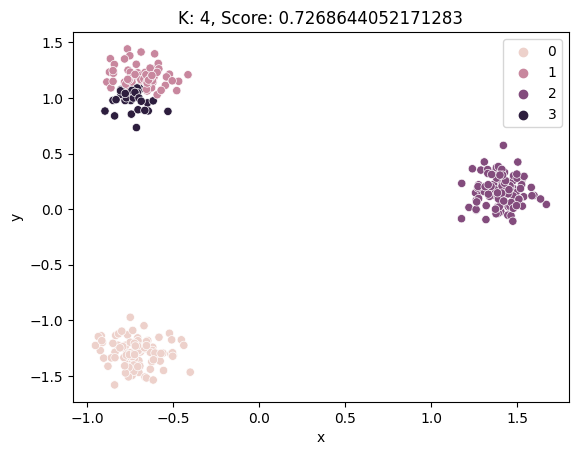

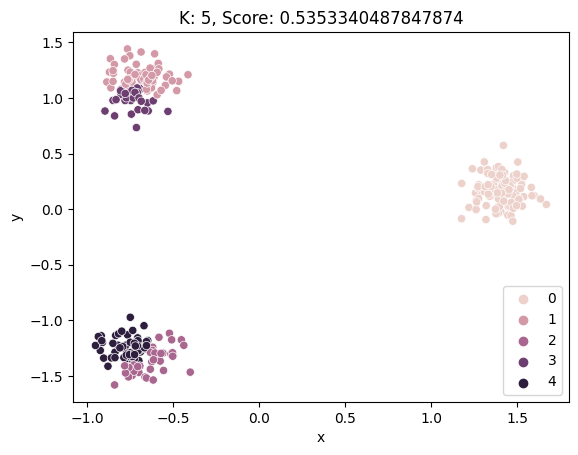

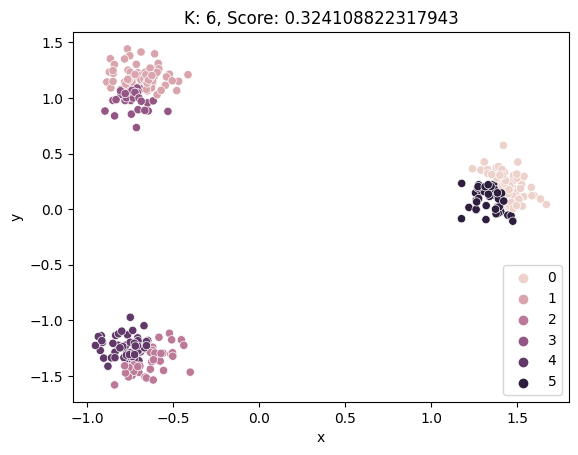

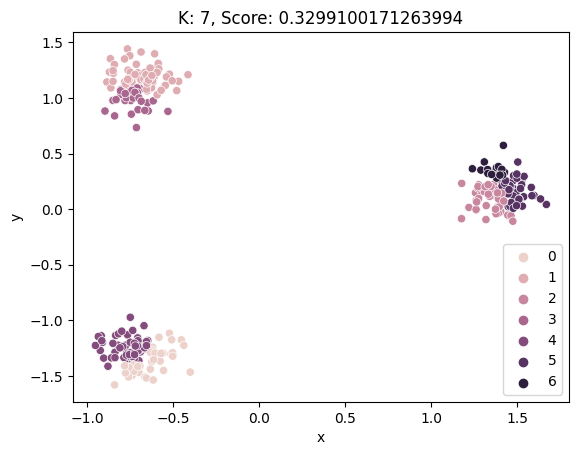

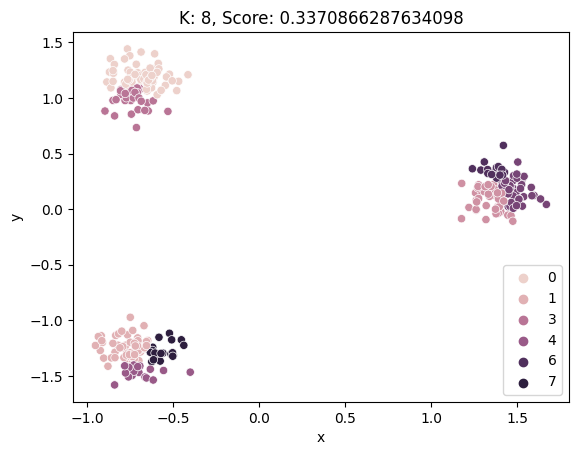

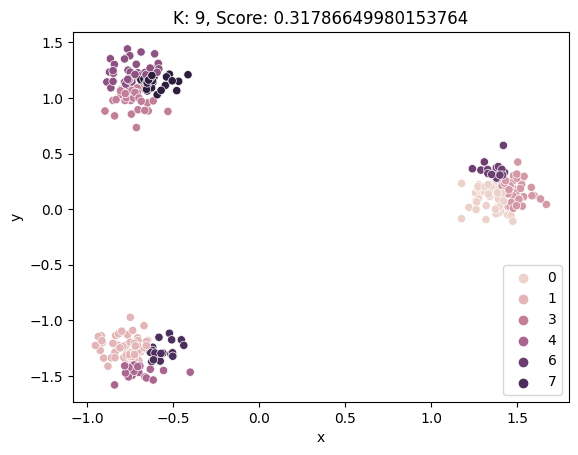

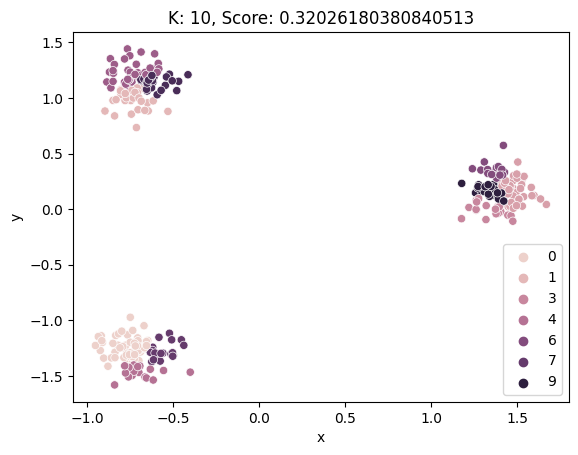

In [138]:
data = d3.copy()
for k in range(2, 11):
    model = AgglomerativeClustering(n_clusters=k)
    model.fit(data)
    sns.scatterplot(data=data, x='x', y='y', hue=model.labels_)
    score = silhouette_score(data, model.labels_)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()

### GaussianMixture

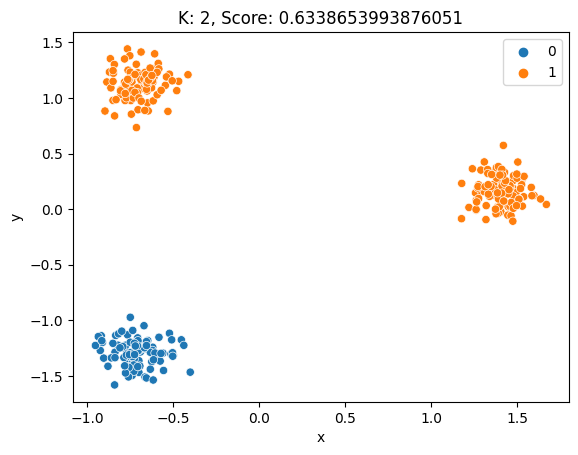

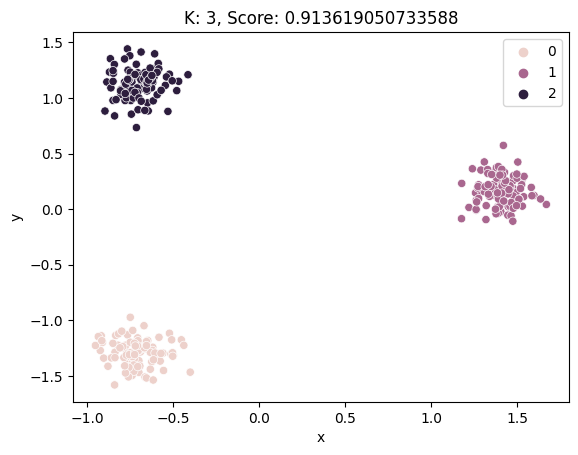

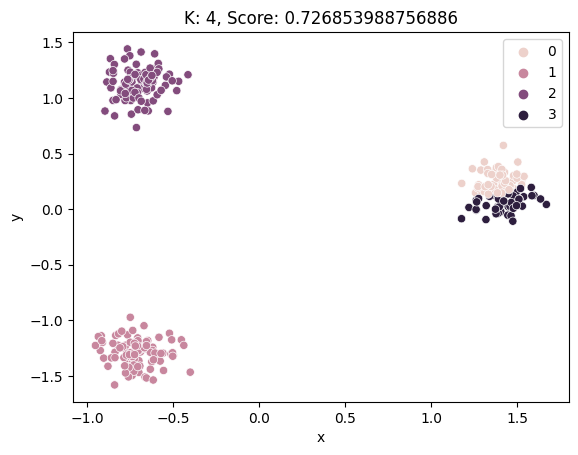

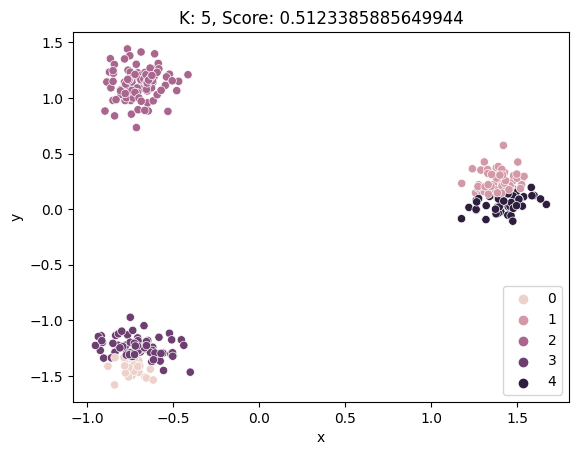

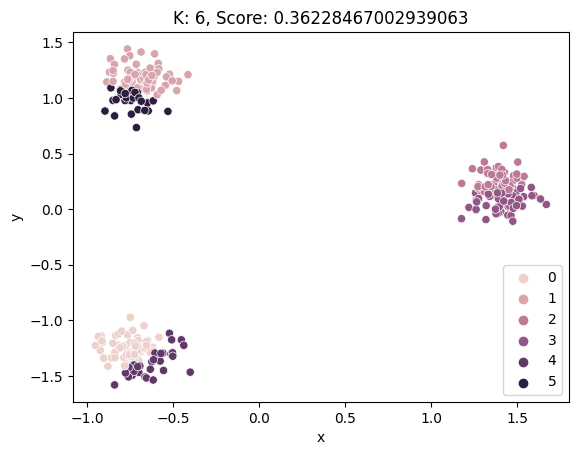

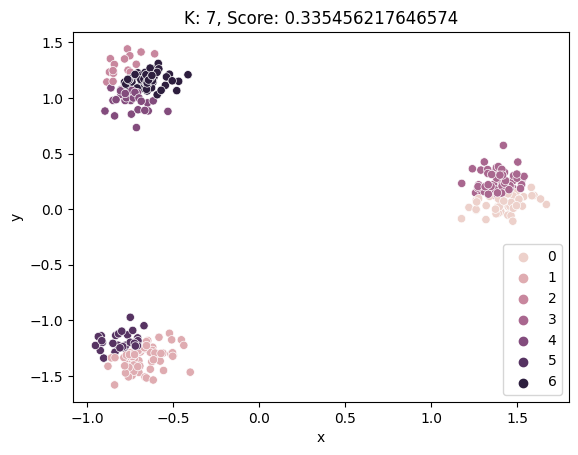

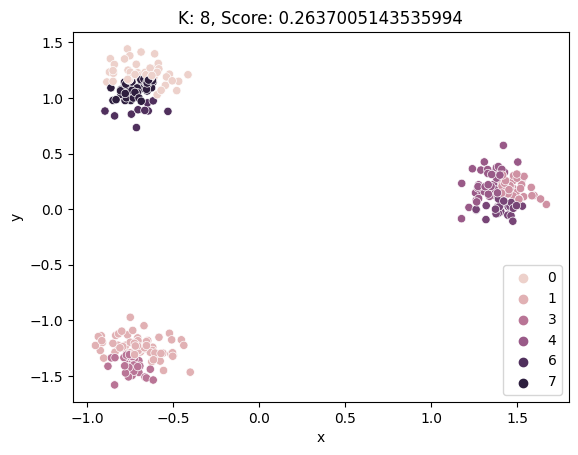

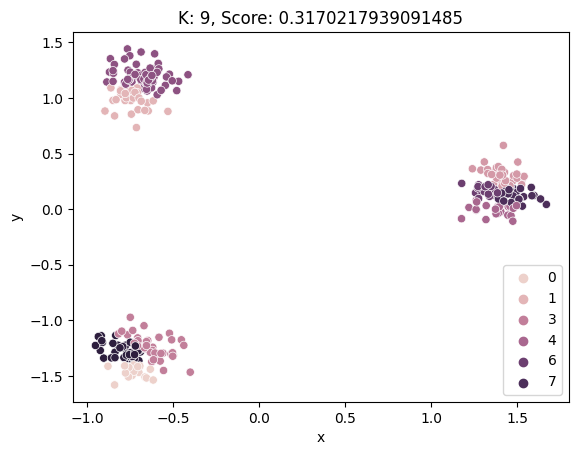

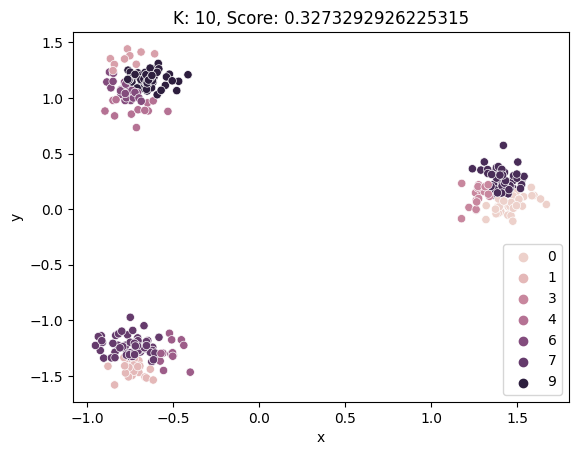

In [139]:
data = d3.copy()
for k in range(2, 11):
    model = GaussianMixture(k)
    model.fit(data)
    labels = model.predict(data)
    sns.scatterplot(data=data, x='x', y='y', hue=labels)
    score = silhouette_score(data, labels)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()

## Dataset 4

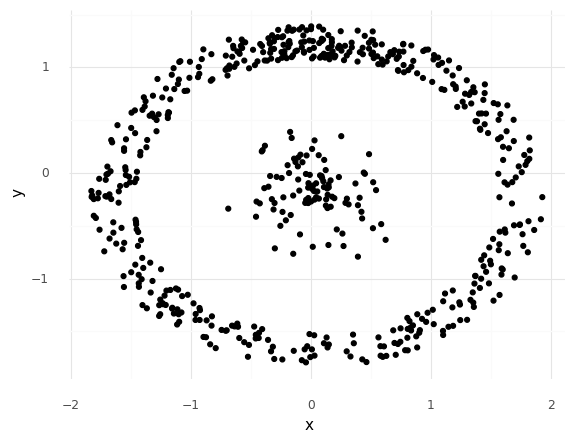

<ggplot: (170829458913)>

In [171]:
d4 = pd.read_csv("https://raw.githubusercontent.com/cmparlettpelleriti/CPSC392ParlettPelleriti/master/Data/KMEM4.csv")

z = StandardScaler()
d4[["x","y"]] = z.fit_transform(d4)

ggplot(d4, aes(x = "x", y = "y")) + geom_point() + theme_minimal()

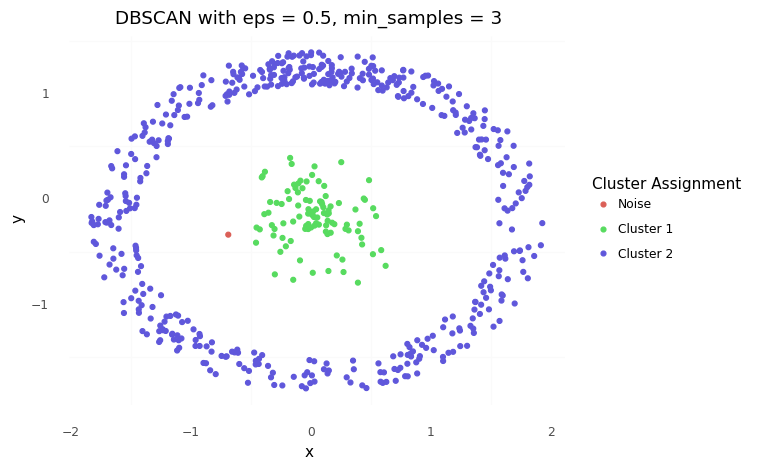

<ggplot: (170830544041)>

In [180]:
data = d4.copy()
db4 = DBSCAN(eps = 0.24, min_samples = 3).fit(d4)

labsList = ["Noise"]
labsList = labsList  + ["Cluster " + str(i) for i in range(1,len(set(db4.labels_)))]

data["assignments"] = db4.labels_

(ggplot(data, aes(x = "x", y = "y", color = "factor(assignments)")) +
 geom_point() +
 theme_minimal() +
 scale_color_discrete(name = "Cluster Assignment",
                      labels = labsList) +
theme(panel_grid_major = element_blank()) +
labs(title = "DBSCAN with eps = 0.5, min_samples = 3"))

In [142]:
# grab only clustered data points
data_clustered = data.loc[(data.assignments >= 0)]

print(silhouette_score(data_clustered[["x","y"]], data_clustered["assignments"]))

# overall 
print(silhouette_score(data[["x","y"]], data["assignments"]))

-0.042911477754913246
-0.042911477754913246


### K-Means

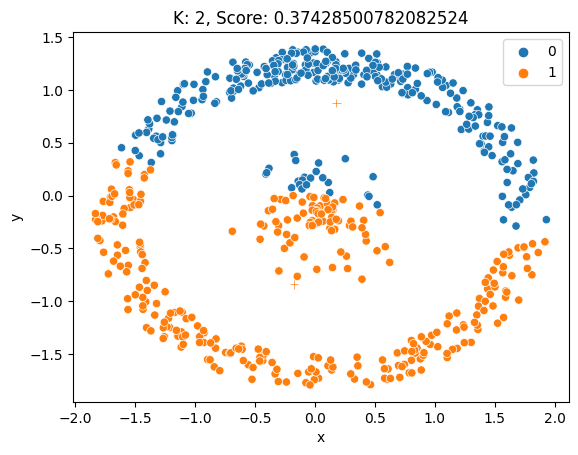

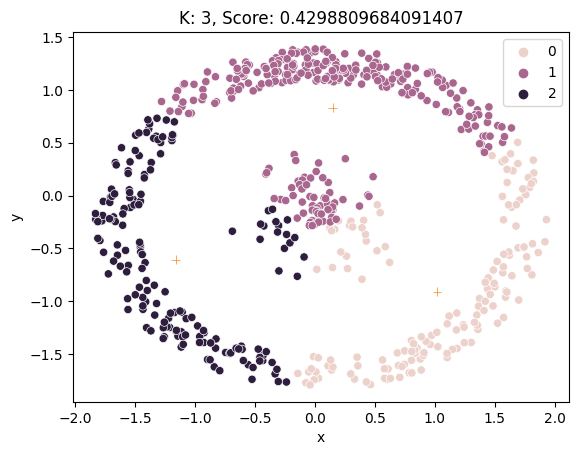

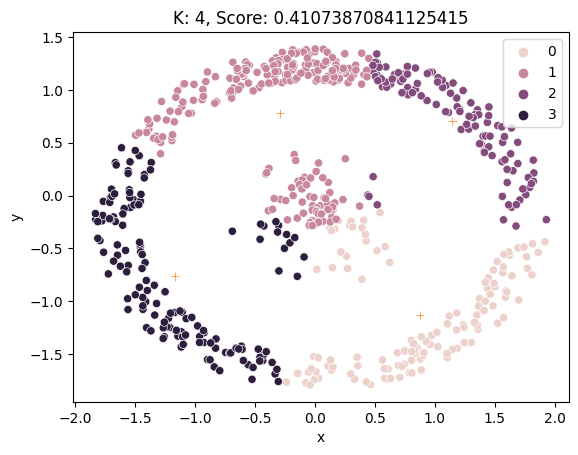

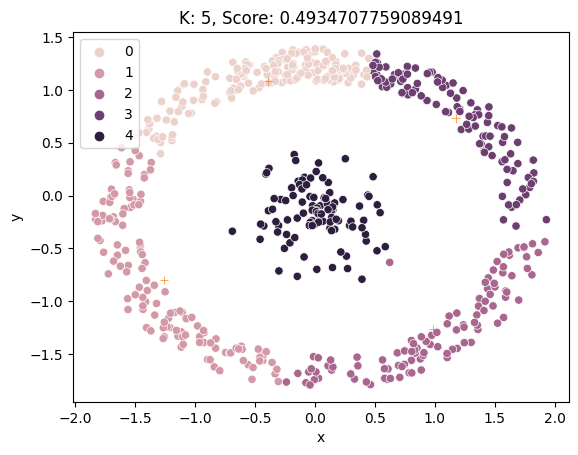

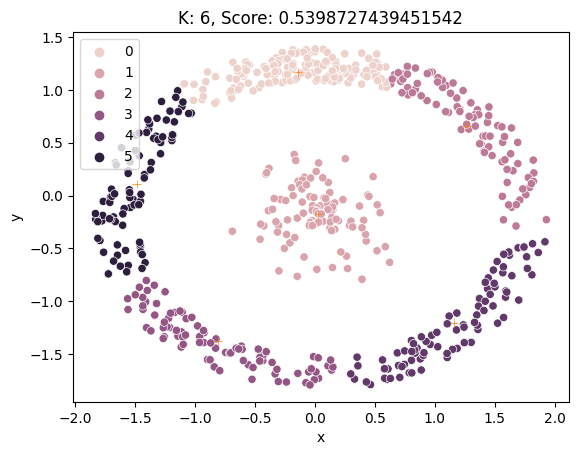

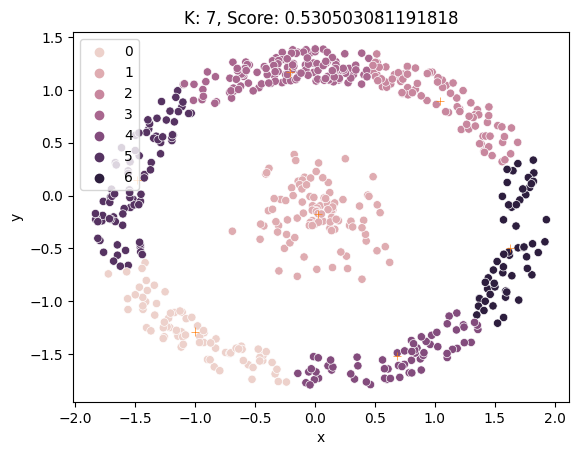

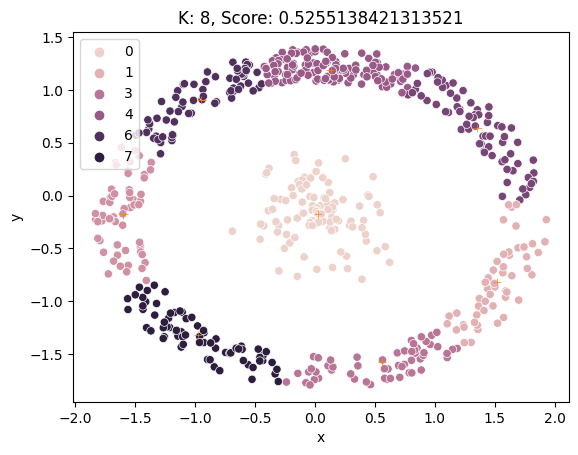

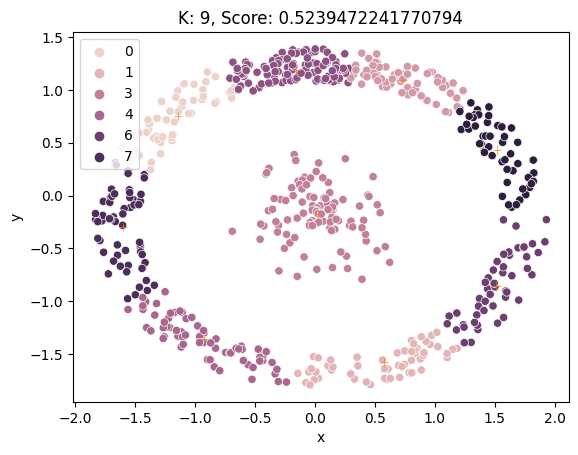

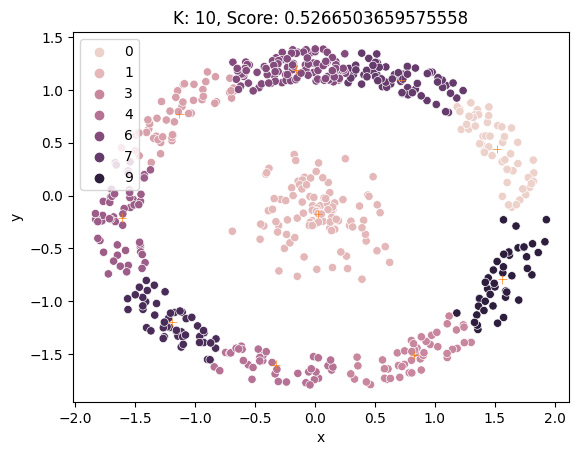

In [143]:
data = d4.copy()
for k in range(2, 11):
    model = KMeans(k)
    model.fit(data)
    sns.scatterplot(data=data, x='x', y='y', hue=model.labels_)
    sns.scatterplot(x=model.cluster_centers_[:,0], y=model.cluster_centers_[:,1], style=True, markers="+", legend=False)
    score = silhouette_score(data, model.labels_)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()


### Hierarchical

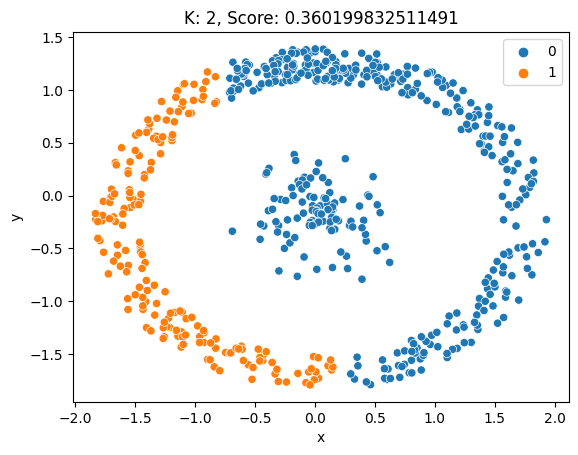

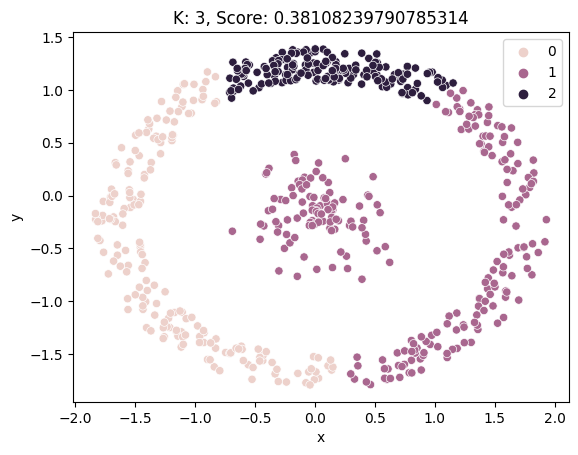

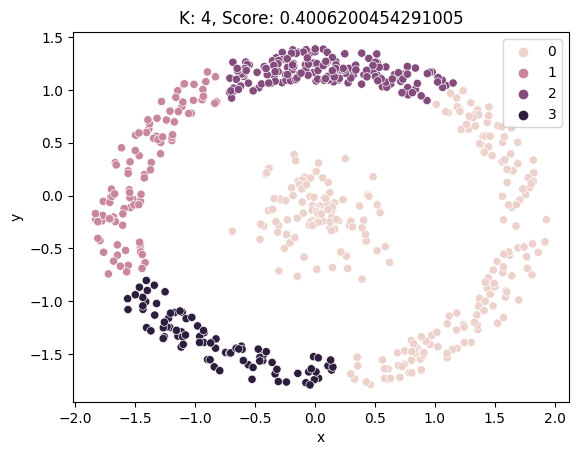

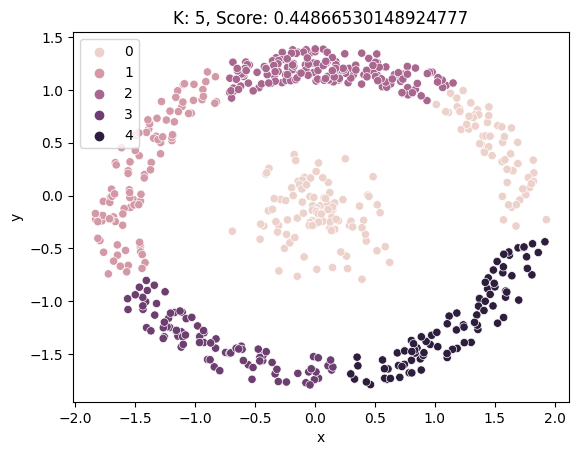

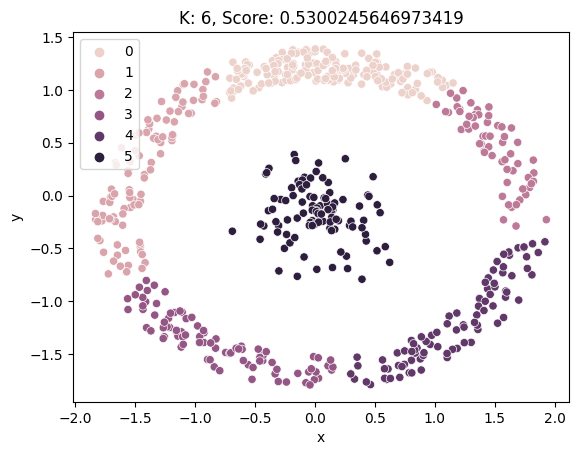

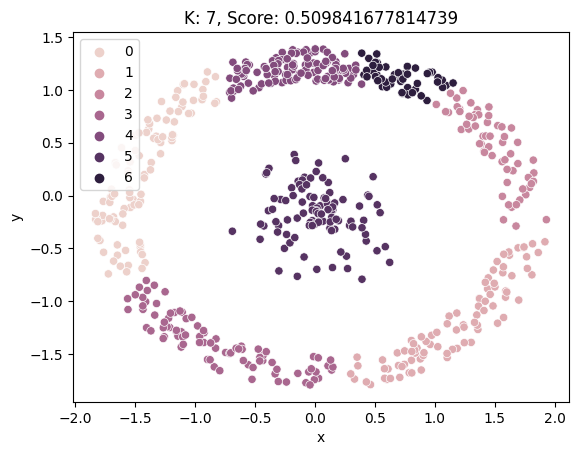

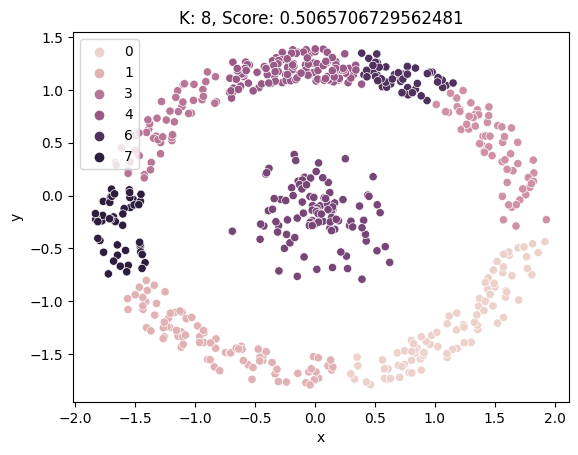

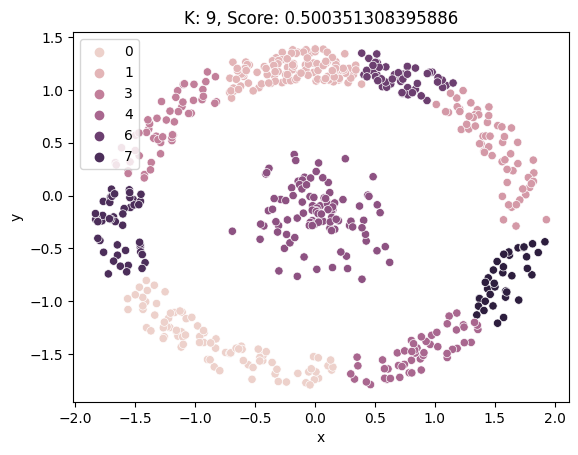

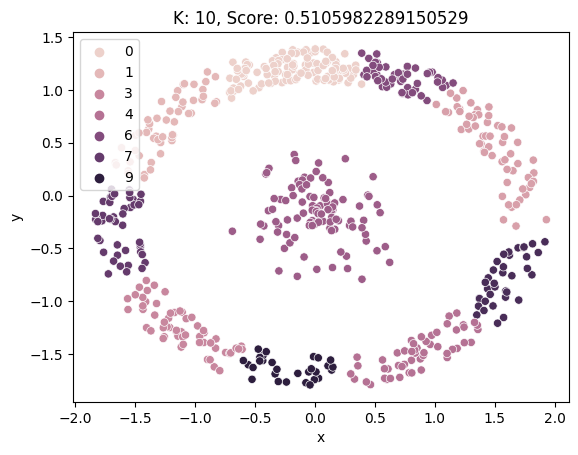

In [144]:
data = d4.copy()
for k in range(2, 11):
    model = AgglomerativeClustering(n_clusters=k)
    model.fit(data)
    sns.scatterplot(data=data, x='x', y='y', hue=model.labels_)
    score = silhouette_score(data, model.labels_)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()

### GaussianMixture

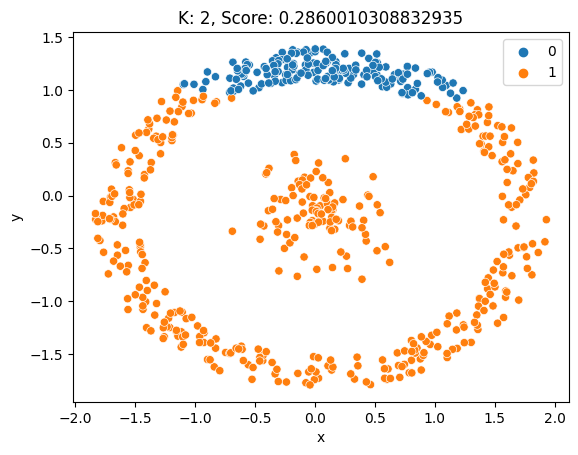

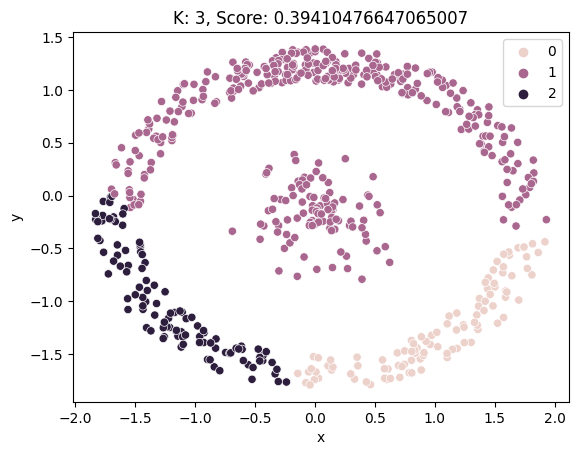

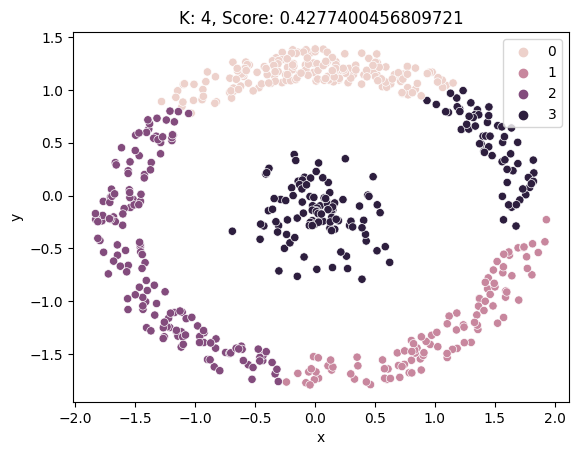

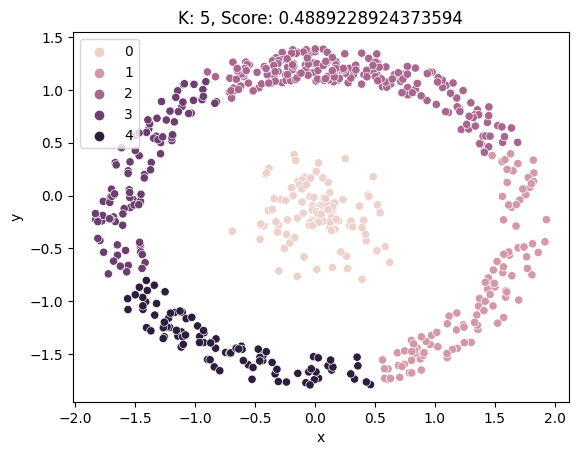

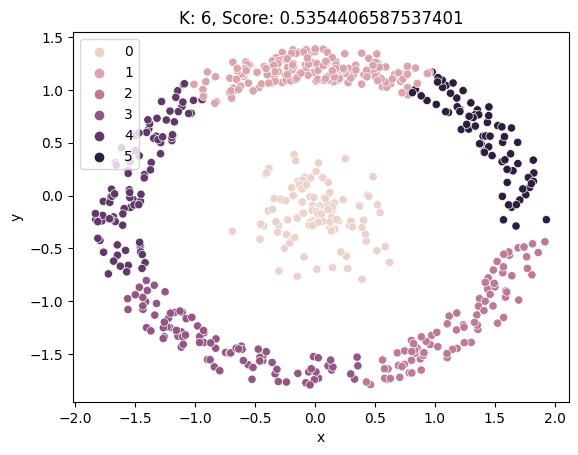

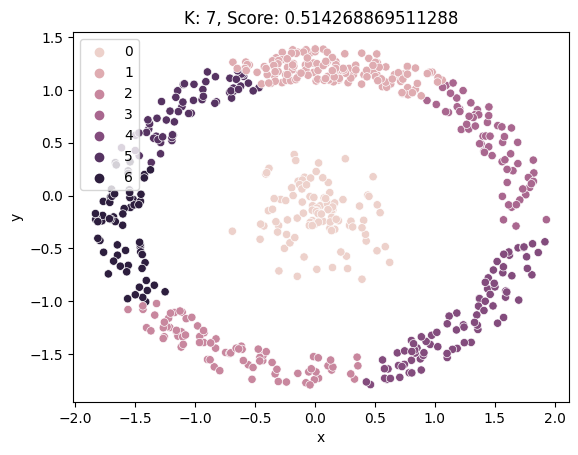

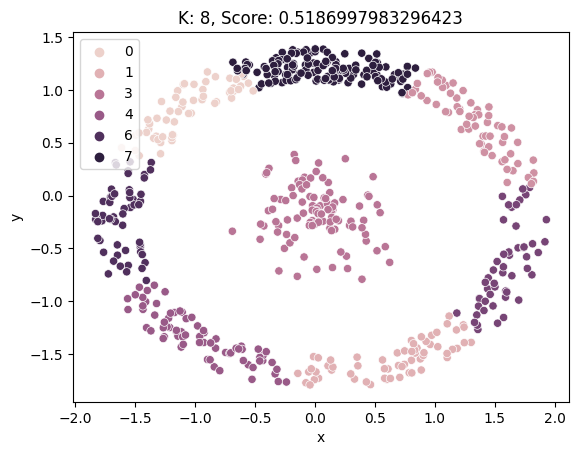

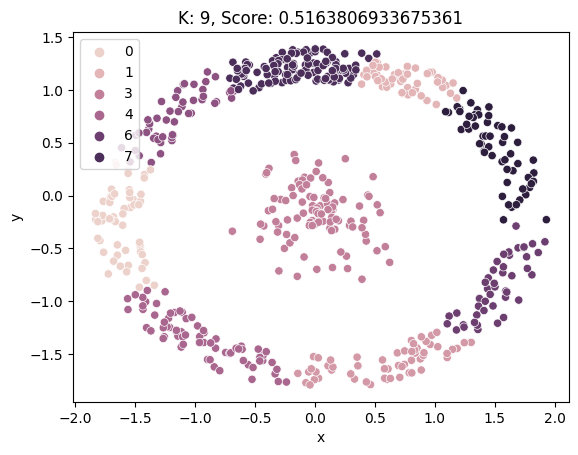

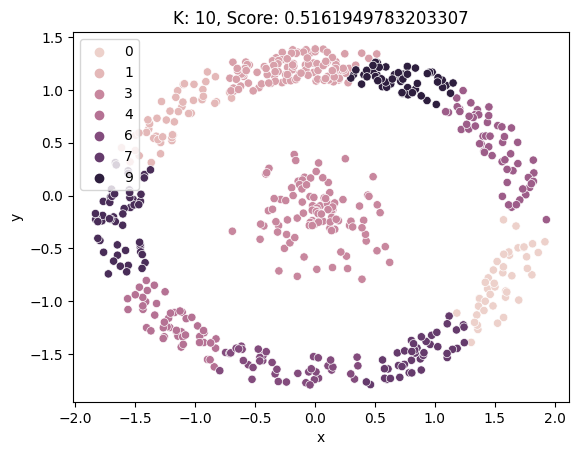

In [145]:
data = d4.copy()
for k in range(2, 11):
    model = GaussianMixture(k)
    model.fit(data)
    labels = model.predict(data)
    sns.scatterplot(data=data, x='x', y='y', hue=labels)
    score = silhouette_score(data, labels)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()

### Compare

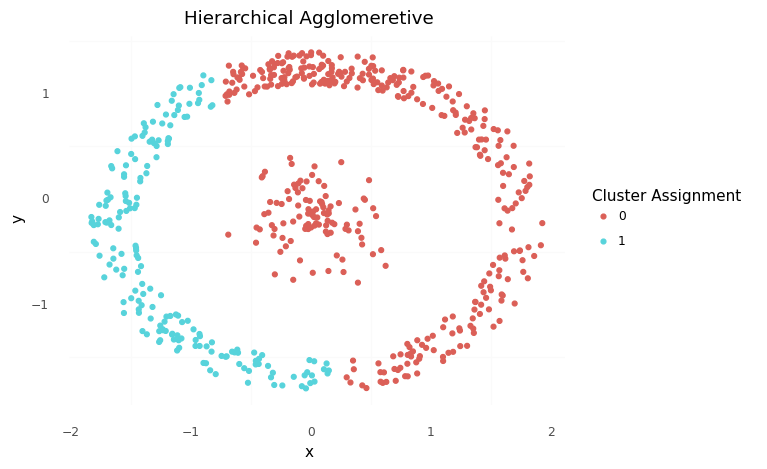

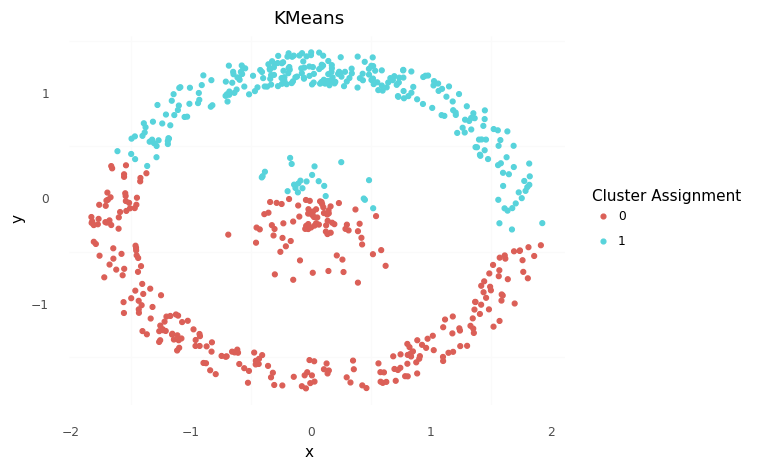

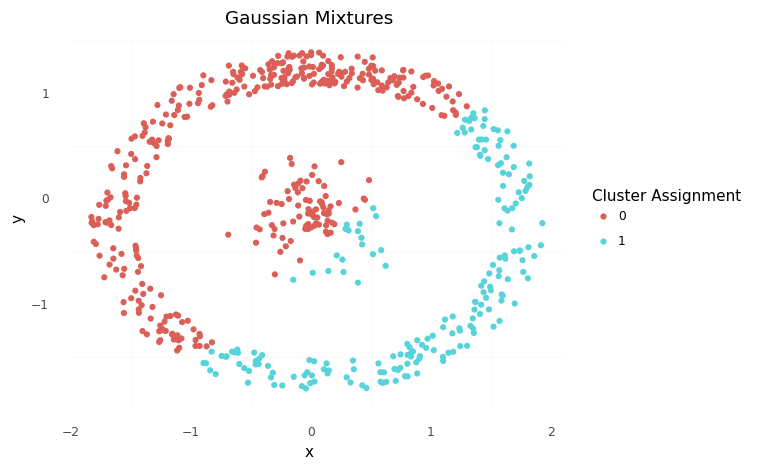

In [146]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

hac = AgglomerativeClustering(2)
km = KMeans(2)
gm = GaussianMixture(2)

hac.fit(d4[["x","y"]])
km.fit(d4[["x","y"]])
gm.fit(d4[["x","y"]])

d4["hac"] = hac.labels_
d4["km"] = km.labels_
d4["gm"] = gm.predict(d4[["x","y"]])


print(ggplot(d4, aes(x = "x", y = "y",
                    color = "factor(hac)")) +
             geom_point() +
             theme_minimal() +
             scale_color_discrete(name = "Cluster Assignment") +
             theme(panel_grid_major = element_blank()) + 
             labs(title = "Hierarchical Agglomeretive"))


print(ggplot(d4, aes(x = "x", y = "y",
                    color = "factor(km)")) +
             geom_point() +
             theme_minimal() +
             scale_color_discrete(name = "Cluster Assignment") +
             theme(panel_grid_major = element_blank()) + 
             labs(title = "KMeans"))


print(ggplot(d4, aes(x = "x", y = "y",
                    color = "factor(gm)")) +
             geom_point() +
             theme_minimal() +
             scale_color_discrete(name = "Cluster Assignment") +
             theme(panel_grid_major = element_blank()) + 
             labs(title = "Gaussian Mixtures"))

## Dataset 5

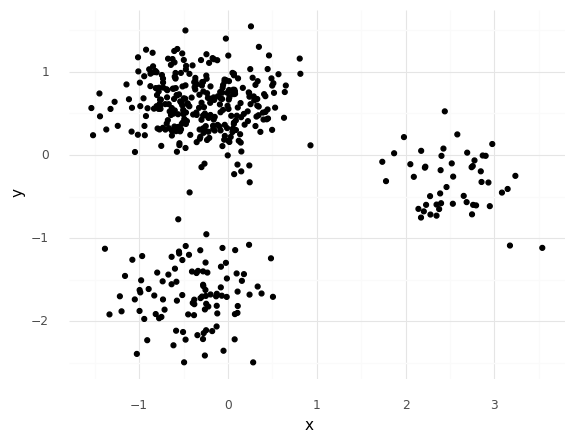

<ggplot: (170834220457)>

In [147]:
d5 = pd.read_csv("https://raw.githubusercontent.com/cmparlettpelleriti/CPSC392ParlettPelleriti/master/Data/KMEM5.csv")

z = StandardScaler()
d5[["x","y"]] = z.fit_transform(d5)

ggplot(d5, aes(x = "x", y = "y")) + geom_point() + theme_minimal()

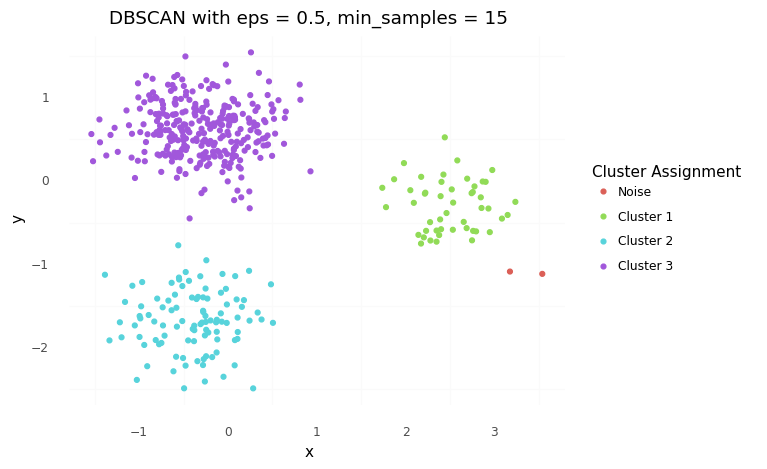

<ggplot: (170829413101)>

In [148]:
data = d5.copy()
db5 = DBSCAN(eps = 0.5, min_samples = 15).fit(d5)

labsList = ["Noise"]
labsList = labsList  + ["Cluster " + str(i) for i in range(1,len(set(db5.labels_)))]

data["assignments"] = db5.labels_

(ggplot(data, aes(x = "x", y = "y", color = "factor(assignments)")) +
 geom_point() +
 theme_minimal() +
 scale_color_discrete(name = "Cluster Assignment",
                      labels = labsList) +
theme(panel_grid_major = element_blank()) +
labs(title = "DBSCAN with eps = 0.5, min_samples = 15"))

In [149]:
# grab only clustered data points
data_clustered = data.loc[(data.assignments >= 0)]

print(silhouette_score(data_clustered[["x","y"]], data_clustered["assignments"]))

# overall 
print(silhouette_score(data[["x","y"]], data["assignments"]))

0.7048131054311416
0.6714107830551044


### K-Means

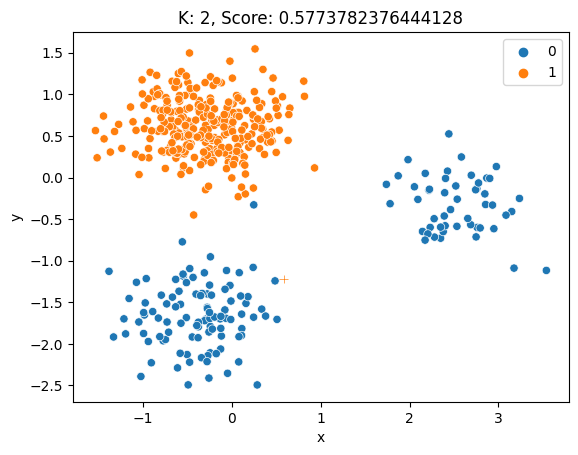

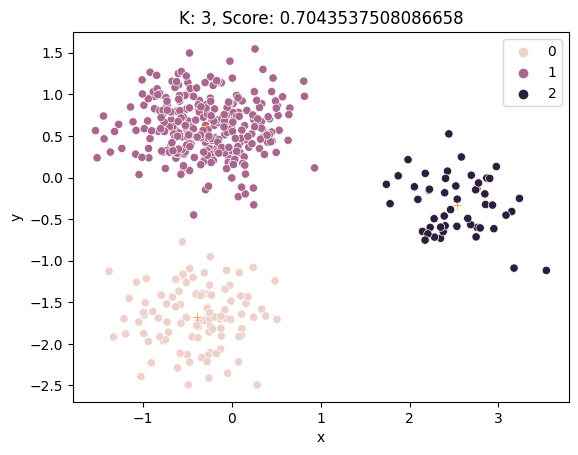

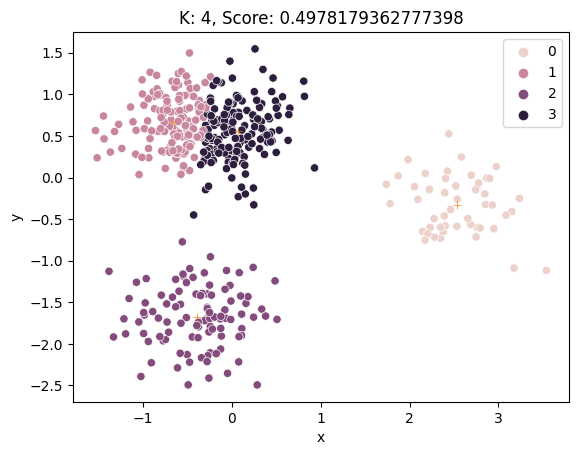

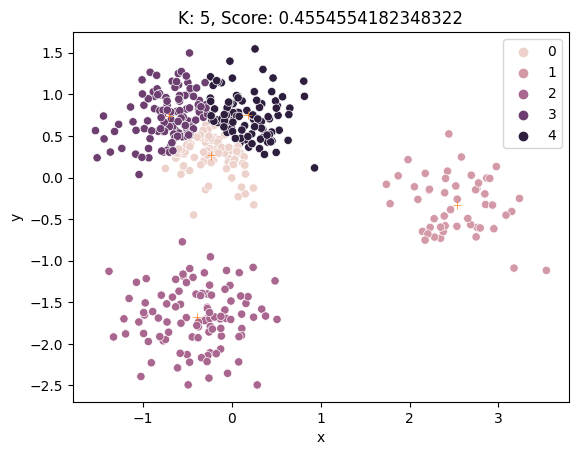

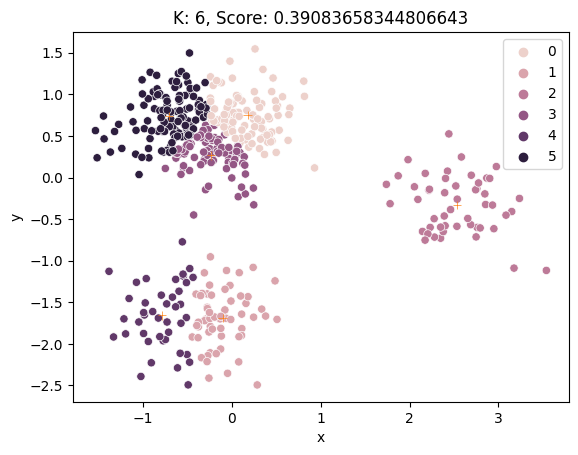

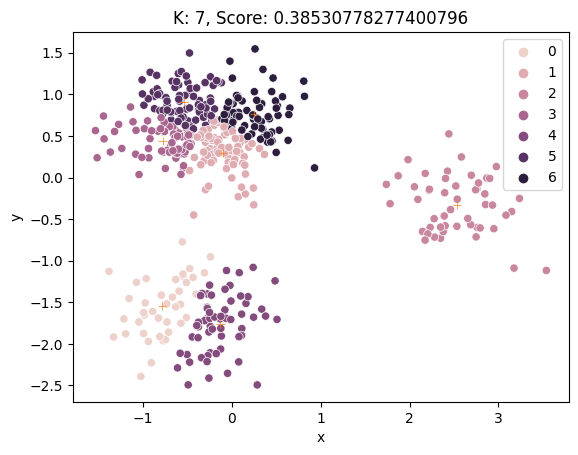

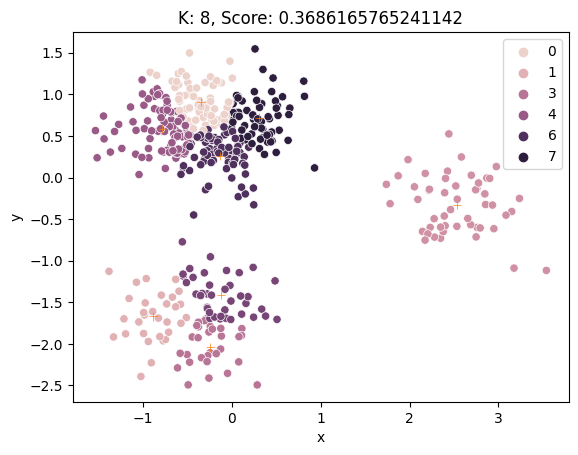

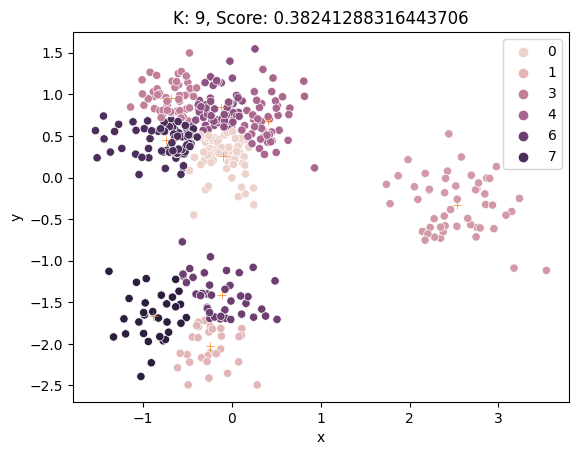

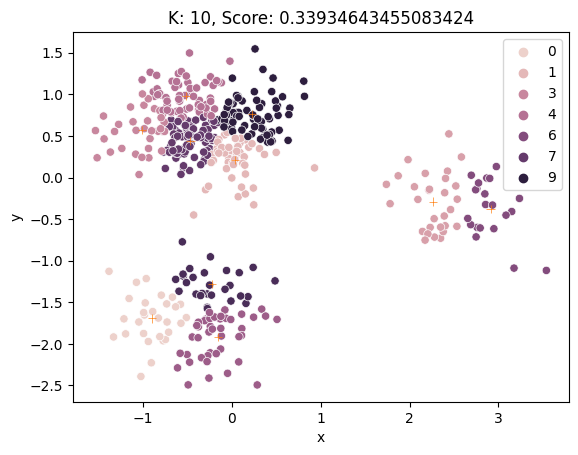

In [150]:
data = d5.copy()
distortions = []
for k in range(2, 11):
    model = KMeans(k)
    model.fit(data)
    distortions.append(model.inertia_)
    sns.scatterplot(data=data, x='x', y='y', hue=model.labels_)
    sns.scatterplot(x=model.cluster_centers_[:,0], y=model.cluster_centers_[:,1], style=True, markers="+", legend=False)
    score = silhouette_score(data, model.labels_)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()


### Hierarchical

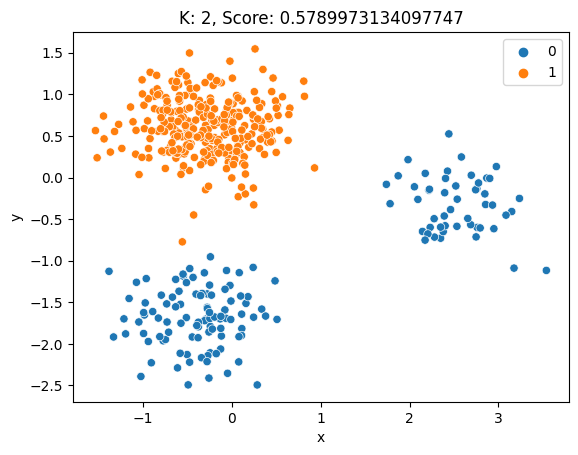

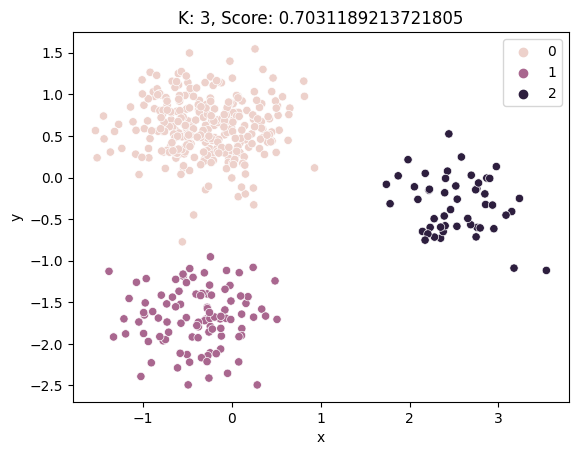

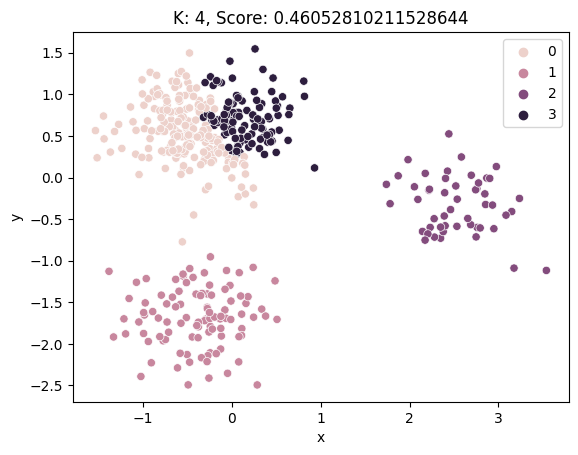

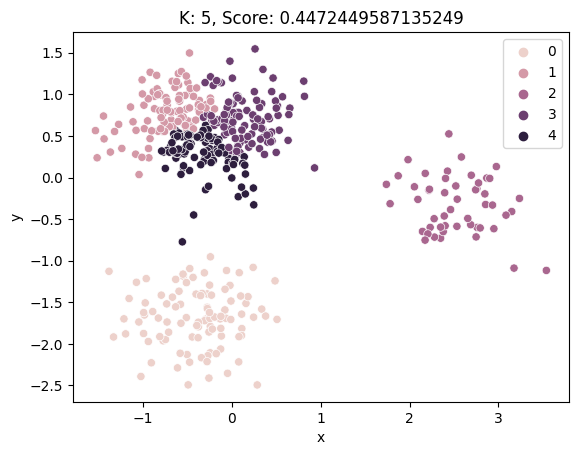

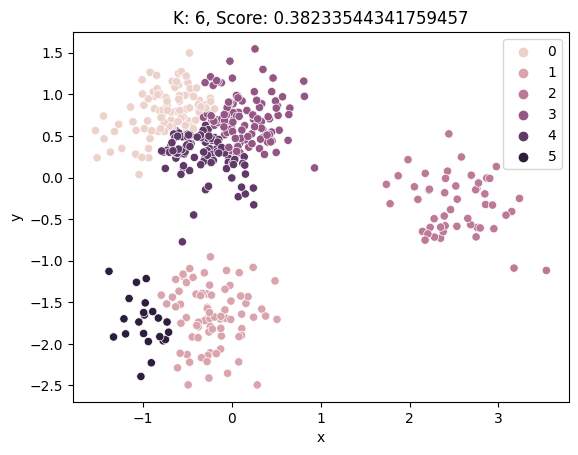

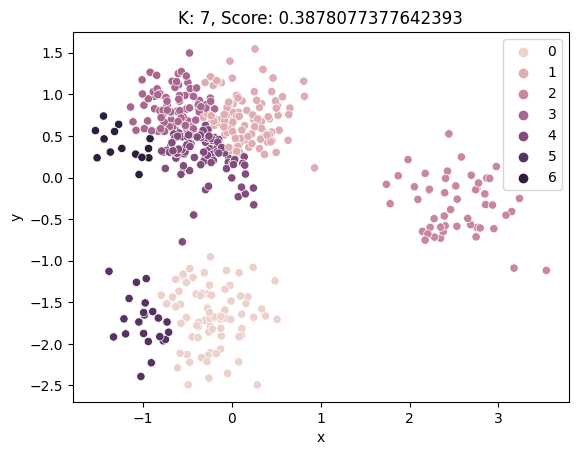

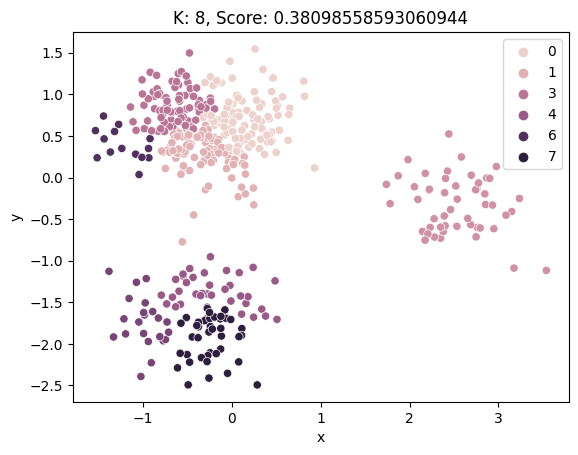

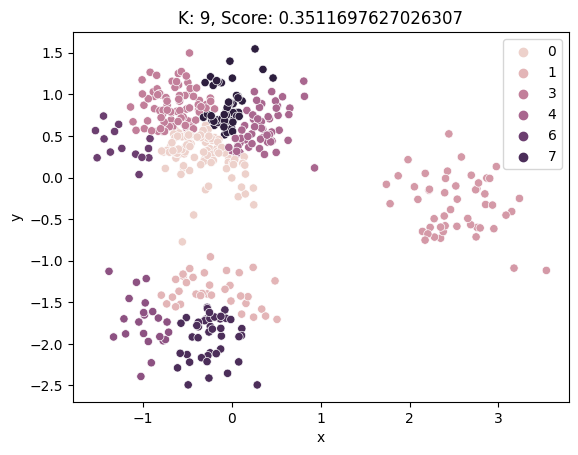

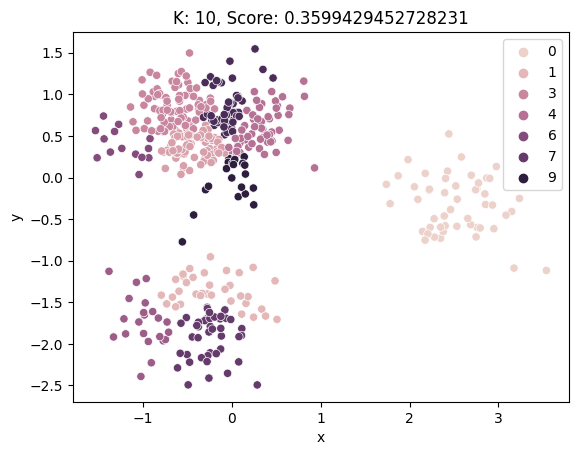

In [151]:
data = d5.copy()
for k in range(2, 11):
    model = AgglomerativeClustering(n_clusters=k)
    model.fit(data)
    sns.scatterplot(data=data, x='x', y='y', hue=model.labels_)
    score = silhouette_score(data, model.labels_)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()

### GaussianMixture

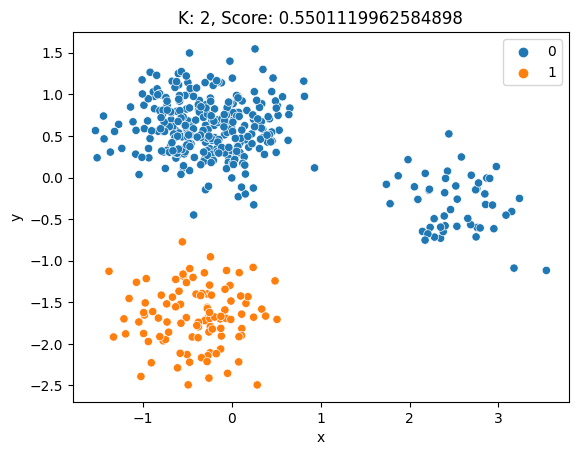

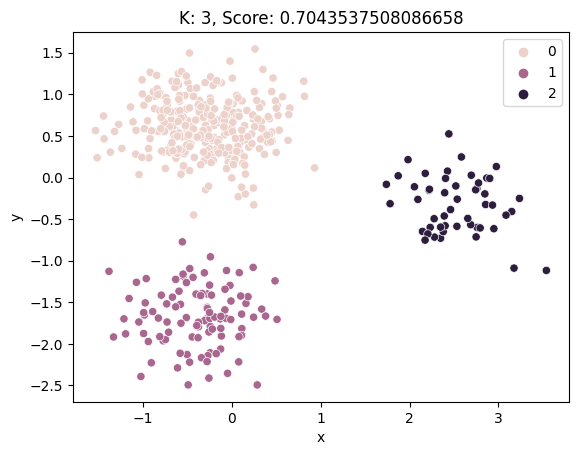

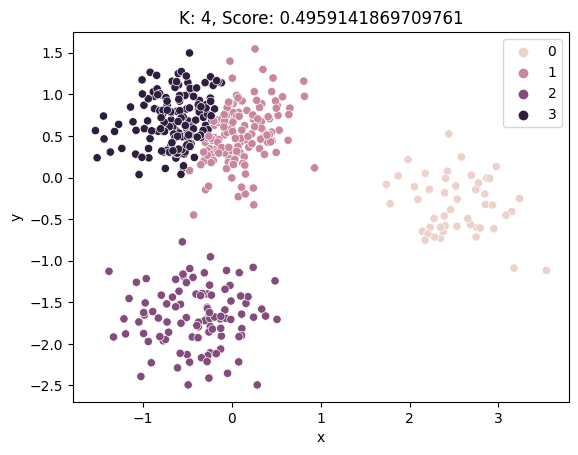

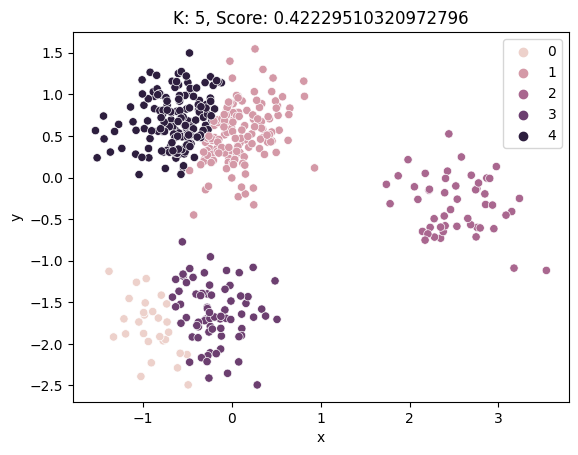

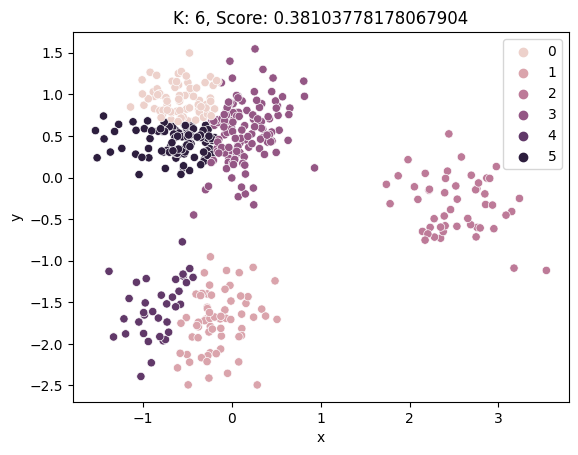

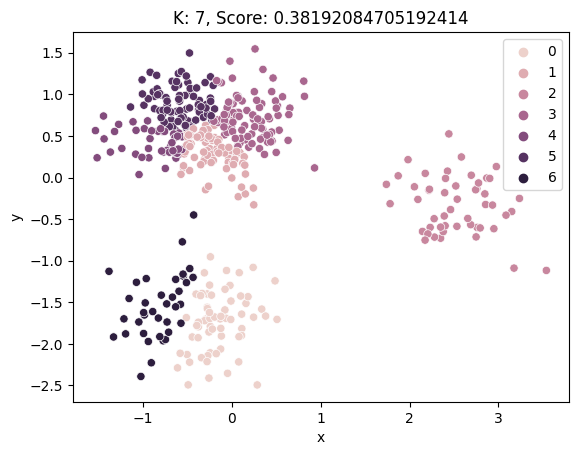

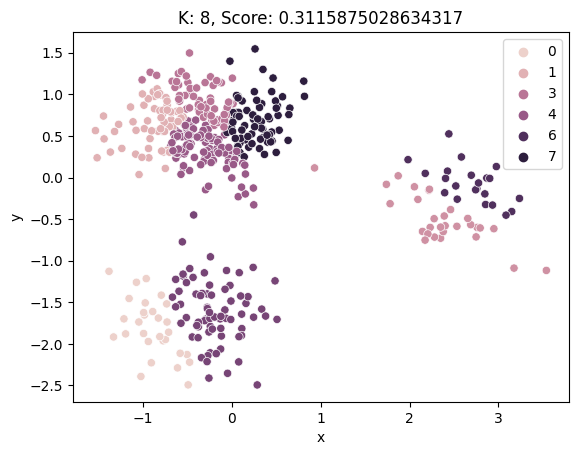

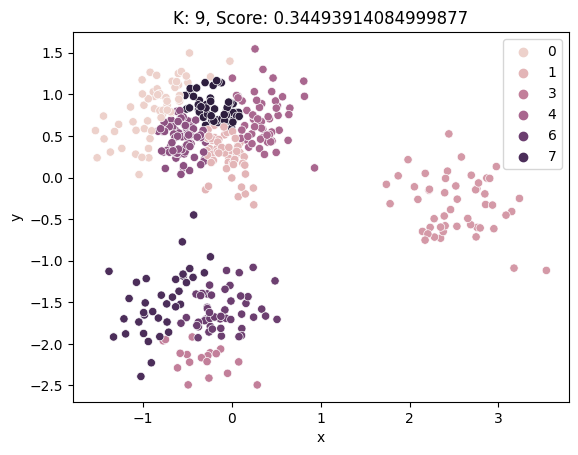

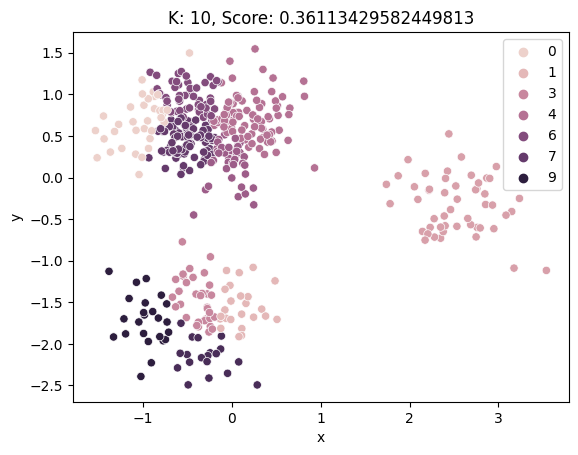

In [152]:
data = d5.copy()
for k in range(2, 11):
    model = GaussianMixture(k)
    model.fit(data)
    labels = model.predict(data)
    sns.scatterplot(data=data, x='x', y='y', hue=labels)
    score = silhouette_score(data, labels)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()

# Elbow Method

Read more [here](https://iopscience.iop.org/article/10.1088/1755-1315/31/1/012012/pdf) if math excites you.

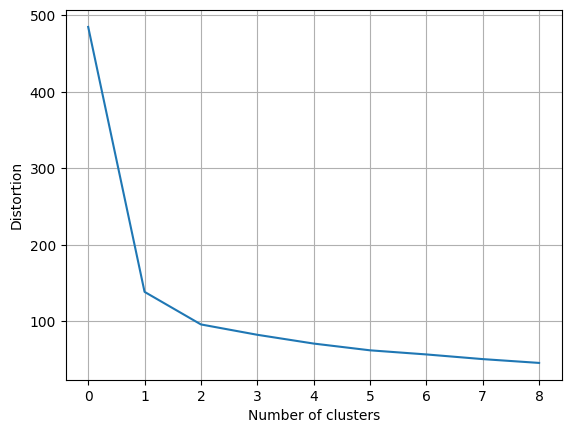

In [153]:
plt.plot(distortions)
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.grid()

## Dataset 6

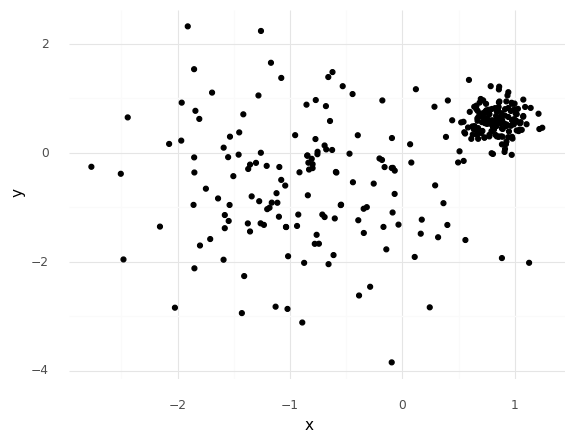

<ggplot: (170834195845)>

In [154]:
d6 = pd.read_csv("https://raw.githubusercontent.com/cmparlettpelleriti/CPSC392ParlettPelleriti/master/Data/KMEM6.csv")

z = StandardScaler()
d6[["x","y"]] = z.fit_transform(d6)

ggplot(d6, aes(x = "x", y = "y")) + geom_point() + theme_minimal()

In [155]:
# we ask for mins + 1 nearest, because the data point it self (distance = 0) is included
mins = 3
nn = NearestNeighbors(n_neighbors=mins + 1)

nn.fit(d6[["x", "y"]])

distances, neighbors = nn.kneighbors(d6[["x", "y"]])

distances

array([[0.        , 0.03690981, 0.04037236, 0.04597748],
       [0.        , 0.05516926, 0.08888159, 0.08986399],
       [0.        , 0.01648388, 0.02195778, 0.02314588],
       ...,
       [0.        , 0.06869733, 0.07309685, 0.07758794],
       [0.        , 0.45863691, 0.62402991, 0.6937056 ],
       [0.        , 0.3352202 , 0.35858311, 0.4012105 ]])

In [156]:
# sort the distances
distances = np.sort(distances[:, mins], axis = 0)

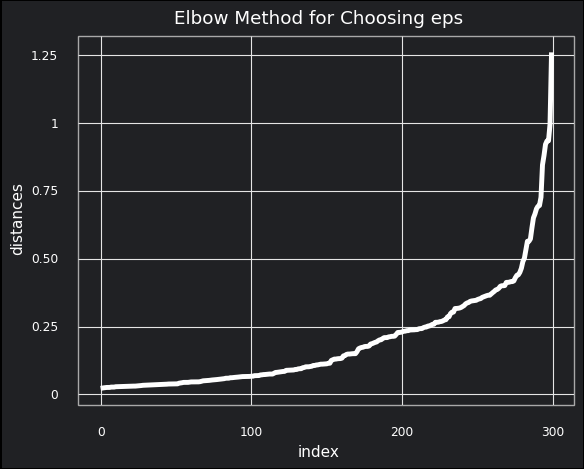

In [157]:
#plot the distances
distances_df = pd.DataFrame({"distances": distances,
                             "index": list(range(0,len(distances)))})
print(ggplot(distances_df, aes(x = "index", y = "distances")) +
 geom_line(color = "white", size = 2) + theme_minimal() +
 labs(title = "Elbow Method for Choosing eps") +
 theme(panel_grid_minor = element_blank(),
      rect = element_rect(fill = "#202124ff"),
      axis_text = element_text(color = "white"),
      axis_title = element_text(color = "white"),
      plot_title = element_text(color = "white"),
      panel_border = element_line(color = "darkgray"),
      plot_background = element_rect(fill = "#202124ff")
      ))

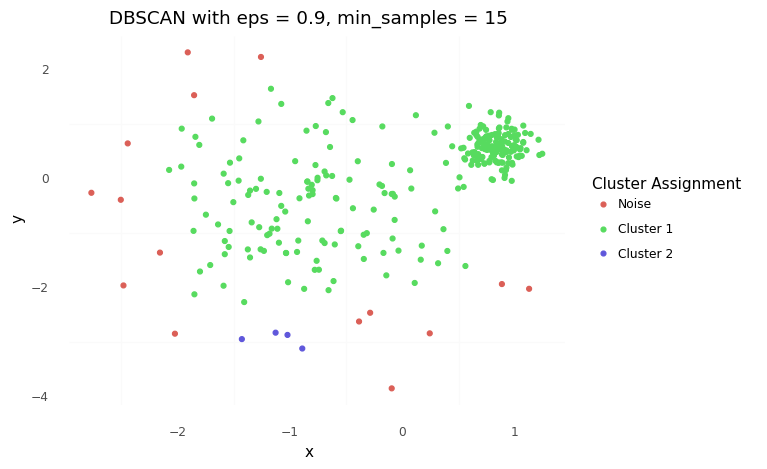

<ggplot: (170824849625)>

In [158]:
data = d6.copy()

db6 = DBSCAN(eps = 0.45, min_samples = 3).fit(d6)

labsList = ["Noise"]
labsList = labsList  + ["Cluster " + str(i) for i in range(1,len(set(db6.labels_)))]

data["assignments"] = db6.labels_

(ggplot(data, aes(x = "x", y = "y", color = "factor(assignments)")) +
 geom_point() +
 theme_minimal() +
 scale_color_discrete(name = "Cluster Assignment",
                      labels = labsList) +
theme(panel_grid_major = element_blank()) +
labs(title = "DBSCAN with eps = 0.9, min_samples = 15"))

In [159]:
# grab only clustered data points
data_clustered = data.loc[(data.assignments >= 0)]

print(silhouette_score(data_clustered[["x","y"]], data_clustered["assignments"]))

# overall 
print(silhouette_score(data[["x","y"]], data["assignments"]))

0.49007245503214775
0.396045290883704


### K-Means

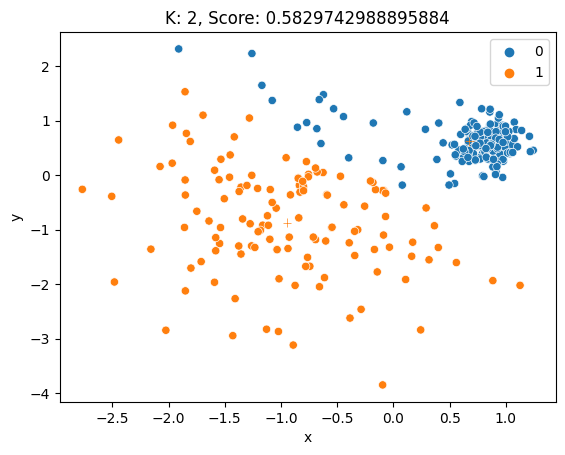

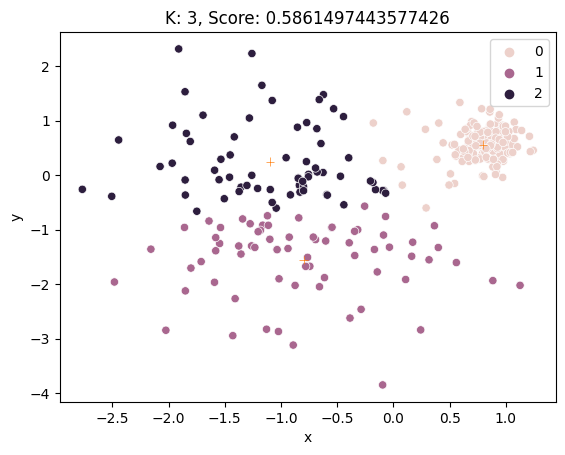

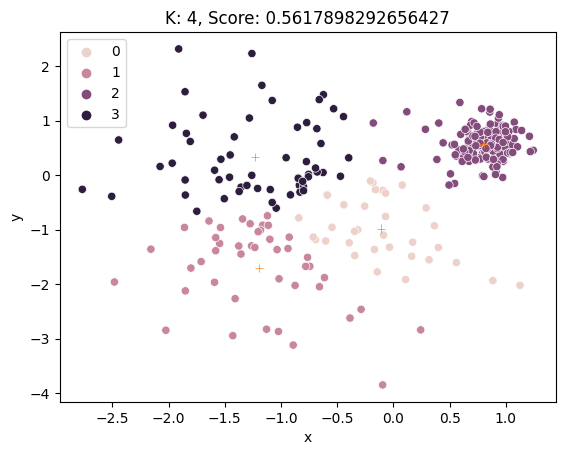

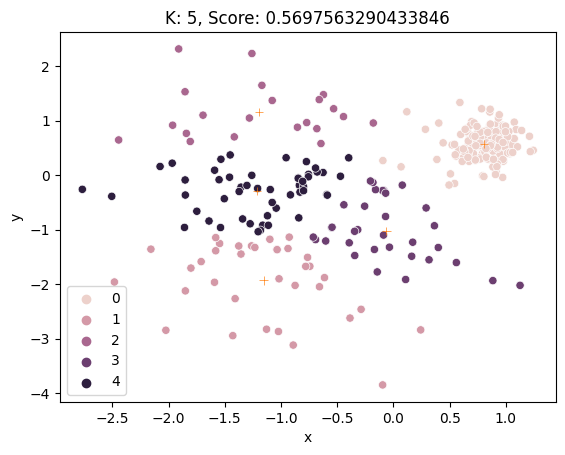

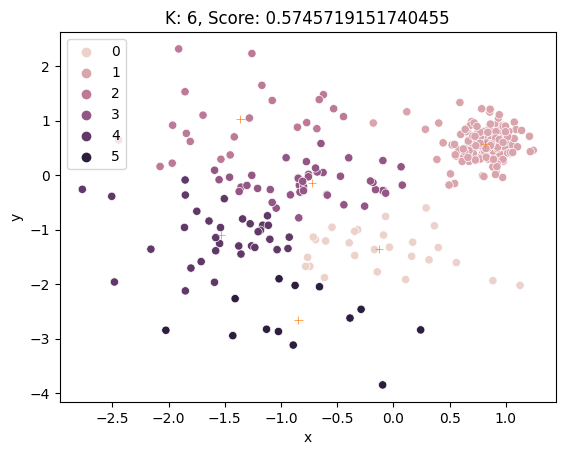

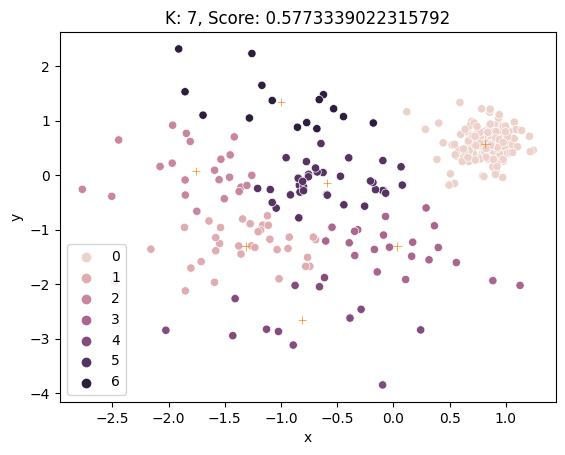

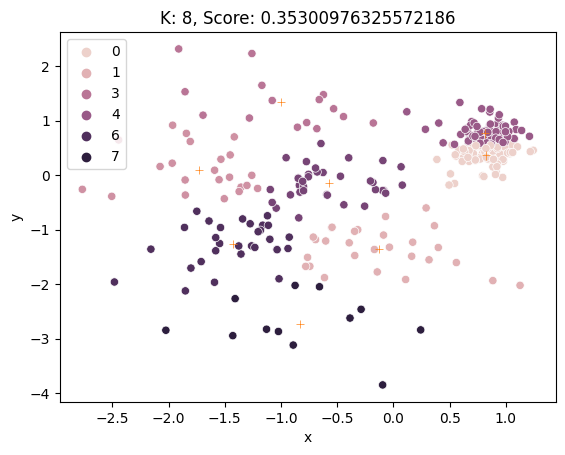

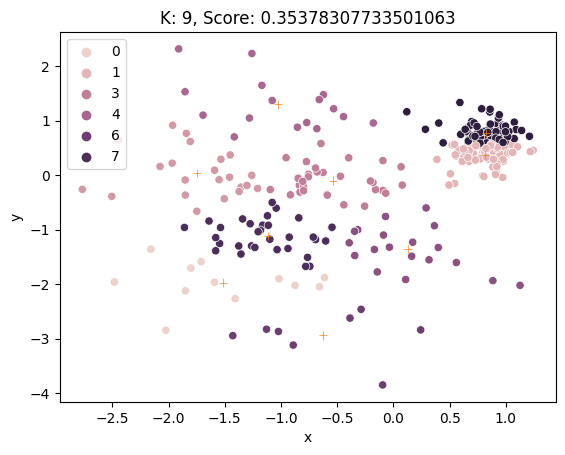

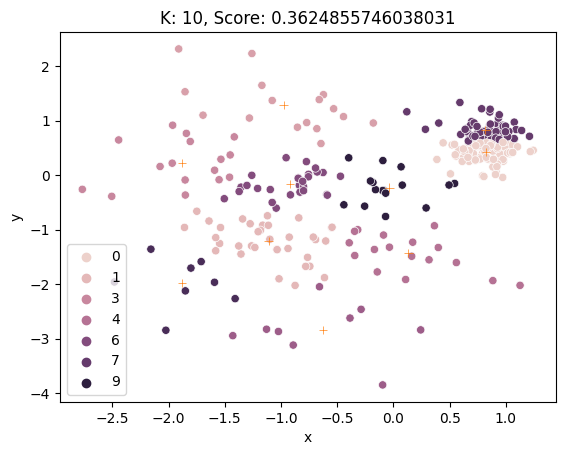

In [160]:
data = d6.copy()
for k in range(2, 11):
    model = KMeans(k)
    model.fit(data)
    sns.scatterplot(data=data, x='x', y='y', hue=model.labels_)
    sns.scatterplot(x=model.cluster_centers_[:,0], y=model.cluster_centers_[:,1], style=True, markers="+", legend=False)
    score = silhouette_score(data, model.labels_)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()


### Hierarchical

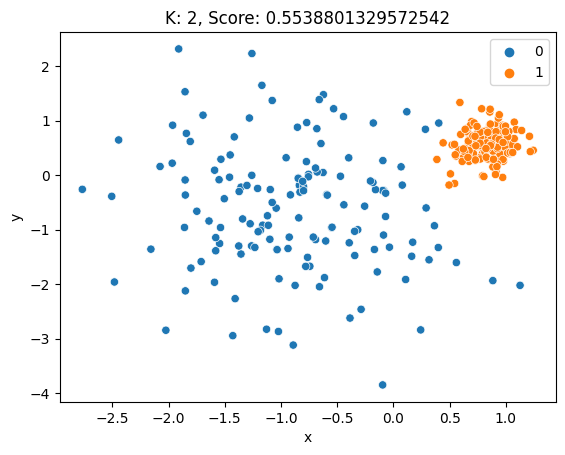

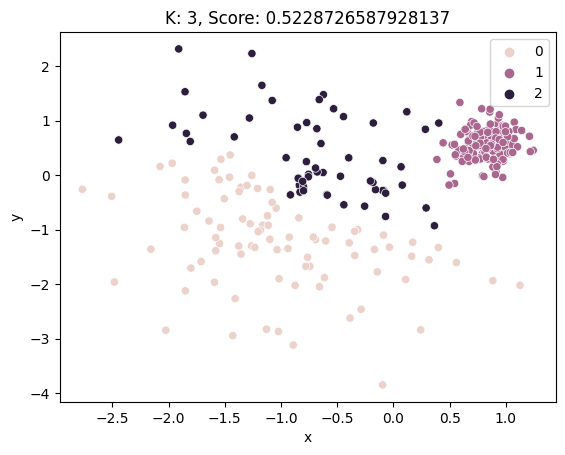

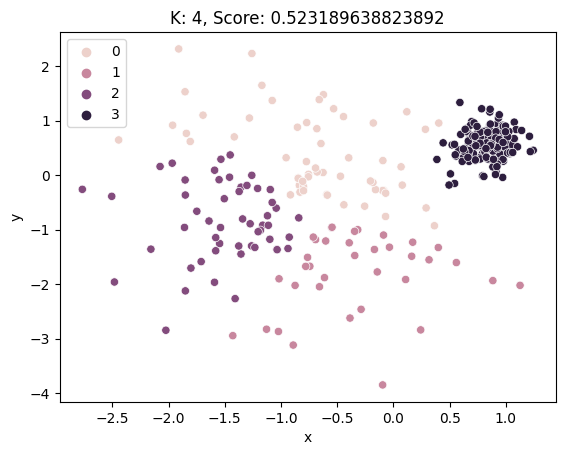

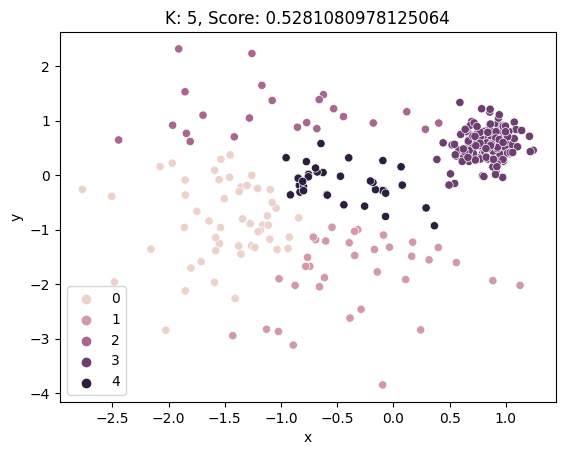

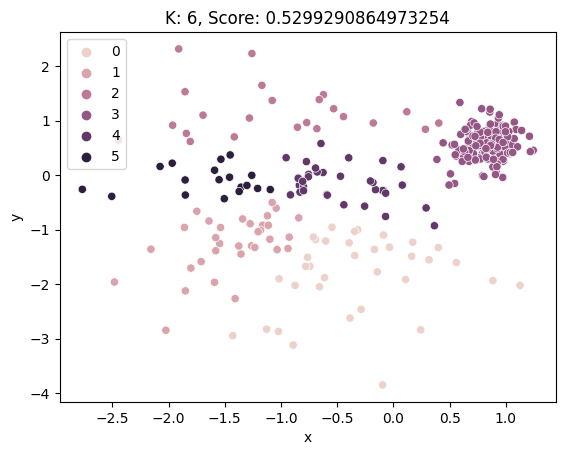

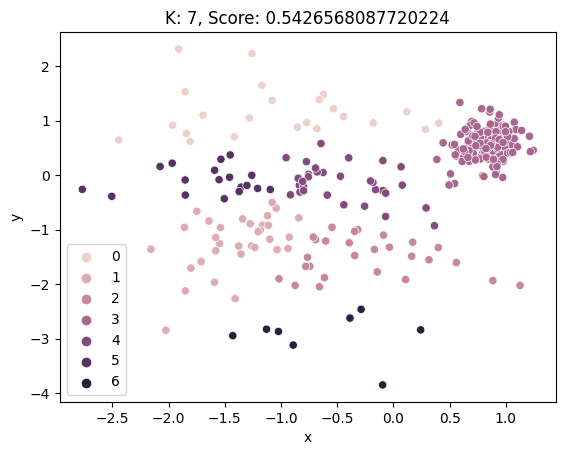

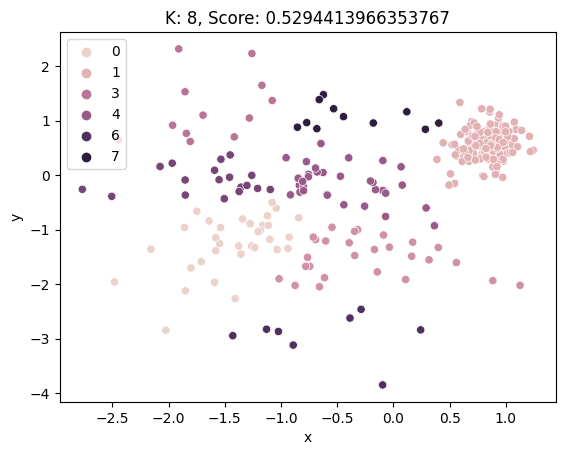

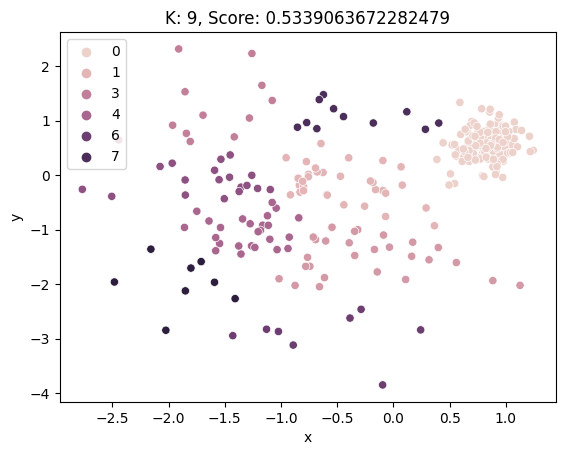

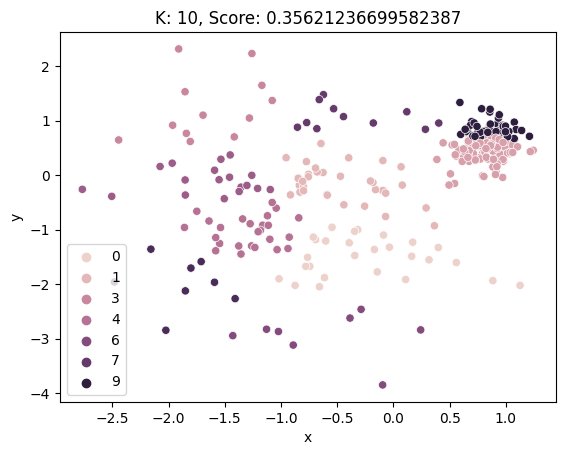

In [161]:
data = d6.copy()
for k in range(2, 11):
    model = AgglomerativeClustering(n_clusters=k)
    model.fit(data)
    sns.scatterplot(data=data, x='x', y='y', hue=model.labels_)
    score = silhouette_score(data, model.labels_)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()

### GaussianMixture

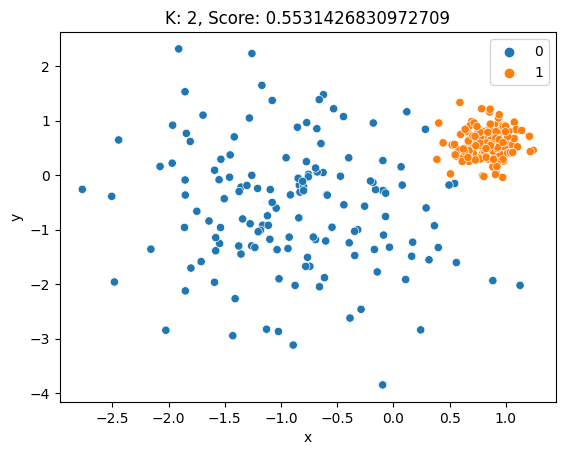

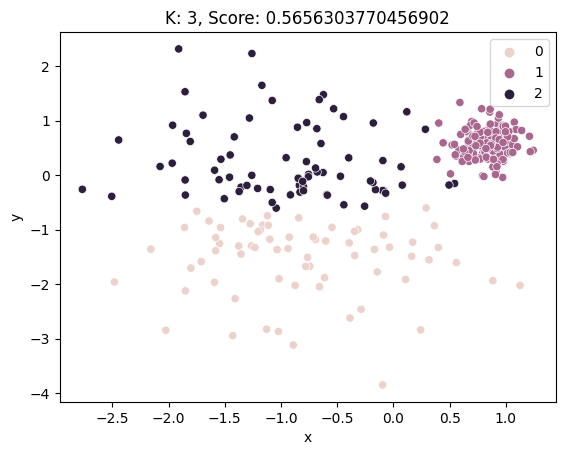

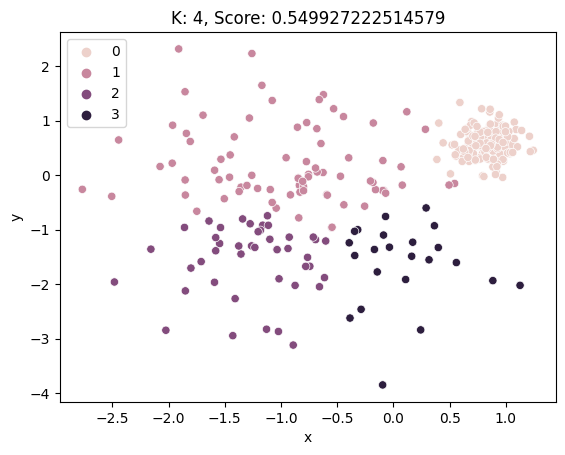

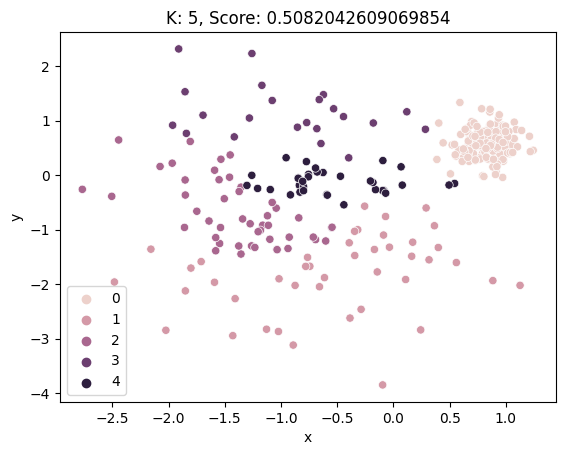

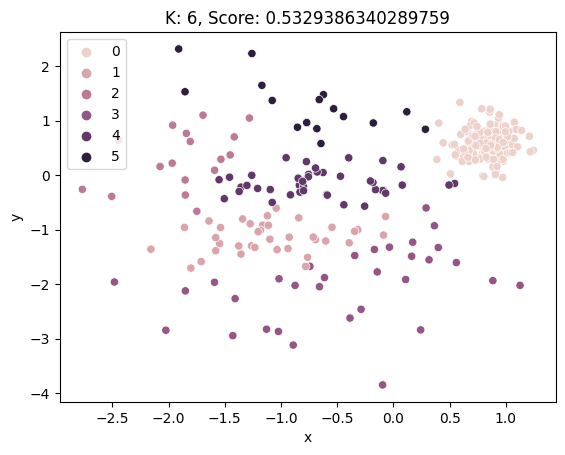

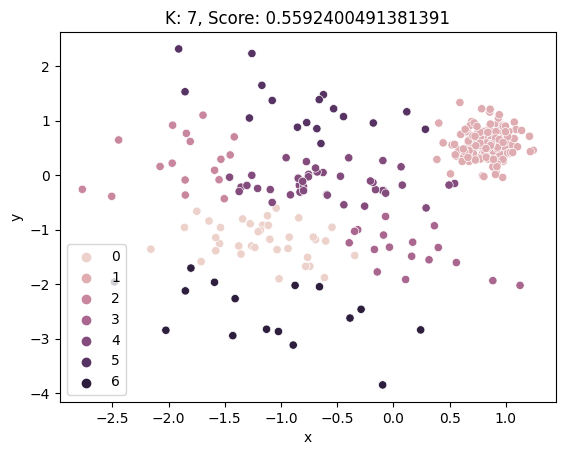

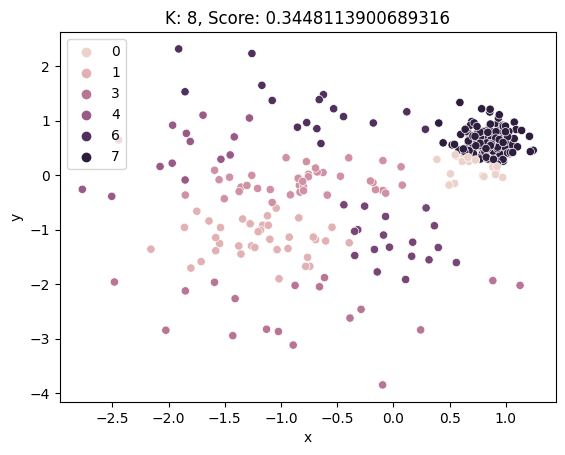

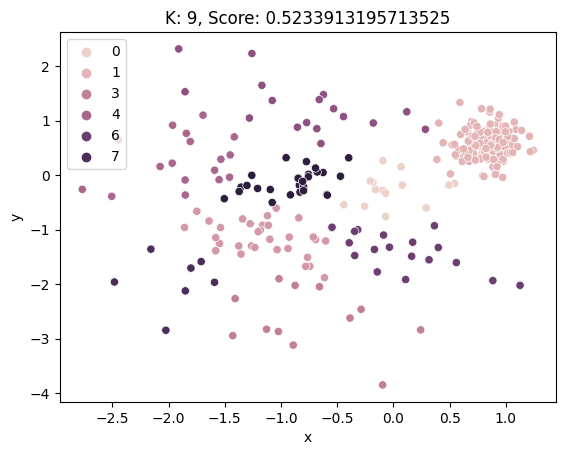

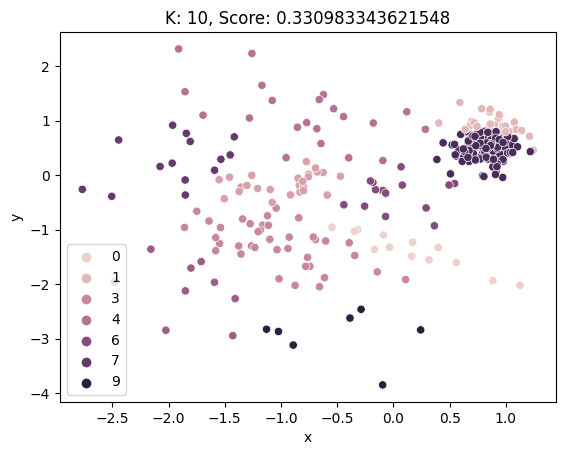

In [162]:
data = d6.copy()
for k in range(2, 11):
    model = GaussianMixture(k)
    model.fit(data)
    labels = model.predict(data)
    sns.scatterplot(data=data, x='x', y='y', hue=labels)
    score = silhouette_score(data, labels)
    plt.title(f'K: {k}, Score: {score}')
    plt.show()